In [2]:
import os
import sys
import json
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import statistics as stats
notebook_dir = os.getcwd()  # This is the current working dir in the notebook
parent_dir = os.path.abspath(os.path.join(notebook_dir, "..")) # this is where utils lies
sys.path.append(parent_dir)
from utils import (
    load_config,
    load_json,
    get_channel_files,
    load_feature_names,
    setup_plot_style
)

"""0-3 = "convnextv2_shot_similarity.pkl": [prev_2,prev_1,next_1,next_2],
        4 = "videoshot_scalemovement.pkl": [ 0.625],   # 0 is extreme closeup, 1 is long shot
        5 = "whisperx_sentiment.pkl": [ 0.375], #neutral= 0.5
        6-9 = "ssv2-vmae_action_shot_similarity.pkl": [prev_2, prev_1, next_1, next_2],
        10 = "llm_evaluative.pkl": [0.75],  # 0 is not evaluative, 1 is evaluative
        11= "shot_density.pkl": [ 0.4651540889451104 ], # 0 is low density, 1 is high density
        12-23 = "speaker_turns_meta.pkl": [active_speaker?, unique_speakers, anchor, reporter, expert, layperson, elite, interview, talkin-head, speech, commenting, voice-over],
        24,25 ="whisperxspeaker_segmentClf.pkl": [malespeaker_present?, femalespeaker_present?],
        26-29 = "face_analysis.pkl": [ average_facesize, unique_faces, regiuon:upper/lower, region:left/right],
        30-36 = "face_emotions_deepface.pkl": [ 'angry', 'disgust', 'fear', 'happy', 'sad', 'surprise', 'neutral'],
        37-45 = "whisperxspeaker_audioclf.pkl": ['Speech', 'Narration', 'Music', 'Animal', 'Vehicle', 'Siren', 'Other_Sound', 'Silence', 'Artillery_fire'],
        46-51  = "whisperx_ner.pkl": [ 1, 2,3,4,5,6 ],
        52-55 = "kinetics-xclip_action_shot_similarity.pkl": [ prev_2, prev_1, next_1, next_2],
        56-59 = "siglip_shot_similarity.pkl": [ prev_2, prev_1, next_1, next_2],
        60-63 ="places_shot_similarity.pkl": [ prev_2, prev_1, next_1, next_2],
        64-67 = "kinetics-vmae_action_shot_similarity.pkl": [prev_2, prev_1, next_1, next_2]
        68-81 = "whisperx_pos.pkl": [ 1, 2... -14],"""

config = load_config()
feature_dict = load_feature_names(config)  
targets = load_json( os.path.join(config["base_path"], "encoding_params.json"))
all_strategies = targets["strategy_order"]
all_feps = targets["fep_order"]
agg_files_dir = os.path.join(config["base_path"], config["paths"]["final"]["feature_vectors"])  
channel_files = get_channel_files(agg_files_dir)


global_instance_id = 0
all_rows = []
 
for channel, files in channel_files.items():
    if channel == ("Test"):
        continue
 
    for file_path in files:
        # The news story name can be extracted from the filename
        news_story_name = os.path.splitext(os.path.basename(file_path))[0]
        data = load_json(file_path, printing=False)
       
        
        for shot_idx, shot_info in data.items():
            # Build one row (dictionary) per shot
            strategies = shot_info.get("strategies", []),
            # get the type of startegies
            strategies = strategies[0] # remove the outer tuple

            feps = shot_info.get("feps", []),
            feps = feps[0]
            duration = shot_info["end"] - shot_info["start"]
            #story_name = shot_info.get("stories", [])[0]
            emotions =  shot_info.get("face_emotions_deepface.pkl", [])
            speaker_genders = shot_info.get("whisperxspeaker_segmentClf.pkl", [])
           
            row = {
                "instance_id": global_instance_id,
                "channel": channel,
                "news_video_story": news_story_name,

                "shot_id": shot_idx,
                
                # Grab the direct numeric fields:
                "start": shot_info.get("start"),
                "end": shot_info.get("end"),
                "duration": duration,
                
                # The main targets (lists) you mentioned:
                "fragmentation": shot_info.get("strategies", [])[0],
                "individualization_of_elite": shot_info.get("strategies", [])[1],
                "individualization_of_reporter": shot_info.get("strategies", [])[2],
                "fragmentation_splitscreen": shot_info.get("strategies", [])[3],
                "emotionalization": shot_info.get("strategies", [])[4],
                "individualization_of_layperson": shot_info.get("strategies", [])[5],
                "alternating-shot": shot_info.get("feps", [])[0],
                "shot-reverse-shot": shot_info.get("feps", [])[1],
                "cut-in": shot_info.get("feps", [])[2],
                "intensify": shot_info.get("feps", [])[3],
                "cut-away": shot_info.get("feps", [])[4],
                
                # Features:
                "whisperx_ner": shot_info.get("whisperx_ner.pkl", []),
                "whisperx_sentiment": shot_info.get("whisperx_sentiment.pkl", [])[0],
                "whisperx_pos": shot_info.get("whisperx_pos.pkl", []),
                "llm_evaluative": shot_info.get("llm_evaluative.pkl", [])[0],
                'angry': emotions[0],
                'disgust': emotions[1],
                'fear': emotions[2],
                'happy': emotions[3],
                'sad': emotions[4],
                'surprise': emotions[5],
                'neutral': emotions[6],
                "videoshot_scalemovement": shot_info.get("videoshot_scalemovement.pkl", [])[0],
                "whisperxspeaker_audioclf": shot_info.get("whisperxspeaker_audioclf.pkl", []), #TODO get values here!
                "male_speaker_present": speaker_genders[0],
                "female_speaker_present": speaker_genders[1],
                "shot_density": shot_info.get("shot_density.pkl", [])[0],
                "active_speaker": shot_info.get("speaker_turns_meta.pkl", [])[0],
                "unique_speakers": shot_info.get("speaker_turns_meta.pkl", [])[1],
                "anchor": shot_info.get("speaker_turns_meta.pkl", [])[2],
                "reporter": shot_info.get("speaker_turns_meta.pkl", [])[3],
                "expert": shot_info.get("speaker_turns_meta.pkl", [])[4],
                "layperson": shot_info.get("speaker_turns_meta.pkl", [])[5],
                "elite": shot_info.get("speaker_turns_meta.pkl", [])[6],
                "interview": shot_info.get("speaker_turns_meta.pkl", [])[7],
                "talkin-head": shot_info.get("speaker_turns_meta.pkl", [])[8],
                "speech": shot_info.get("speaker_turns_meta.pkl", [])[9],
                "commenting": shot_info.get("speaker_turns_meta.pkl", [])[10],
                "voice-over": shot_info.get("speaker_turns_meta.pkl", [])[11],
                "average_facesize": shot_info.get("face_analysis.pkl", [])[0],
                "unique_faces": shot_info.get("face_analysis.pkl", [])[1],
                "face_region_y": shot_info.get("face_analysis.pkl", [])[2],
                "face_region_x": shot_info.get("face_analysis.pkl", [])[3],
                "whisper_speech": shot_info.get("whisperxspeaker_audioclf.pkl", [])[0],
                "whisper_narration": shot_info.get("whisperxspeaker_audioclf.pkl", [])[1],
                "whisper_music": shot_info.get("whisperxspeaker_audioclf.pkl", [])[2],
                "whisper_animal": shot_info.get("whisperxspeaker_audioclf.pkl", [])[3],
                "whisper_vehicle": shot_info.get("whisperxspeaker_audioclf.pkl", [])[4],
                "whisper_siren": shot_info.get("whisperxspeaker_audioclf.pkl", [])[5],
                "whisper_other_sound": shot_info.get("whisperxspeaker_audioclf.pkl", [])[6],
                "whisper_silence": shot_info.get("whisperxspeaker_audioclf.pkl", [])[7],
                "whisper_artillery_fire": shot_info.get("whisperxspeaker_audioclf.pkl", [])[8],

              

                # Shot similarity features:
                "conv_prev2": shot_info.get("convnextv2_shot_similarity.pkl", [])[0],
                "conv_prev1": shot_info.get("convnextv2_shot_similarity.pkl", [])[1],
                "conv_next1": shot_info.get("convnextv2_shot_similarity.pkl", [])[2],
                "conv_next2": shot_info.get("convnextv2_shot_similarity.pkl", [])[3],
                "sig_prev2": shot_info.get("siglip_shot_similarity.pkl", [])[0],
                "sig_prev1": shot_info.get("siglip_shot_similarity.pkl", [])[1],
                "sig_next1": shot_info.get("siglip_shot_similarity.pkl", [])[2],
                "sig_next2": shot_info.get("siglip_shot_similarity.pkl", [])[3],
                "places_prev2": shot_info.get("places_shot_similarity.pkl", [])[0],
                "places_prev1": shot_info.get("places_shot_similarity.pkl", [])[1],
                "places_next1": shot_info.get("places_shot_similarity.pkl", [])[2],
                "places_next2": shot_info.get("places_shot_similarity.pkl", [])[3],
                "kinX_act_prev2": shot_info.get("kinetics-xclip_action_shot_similarity.pkl", [])[0],
                "kinX_act_prev1": shot_info.get("kinetics-xclip_action_shot_similarity.pkl", [])[1],
                "kinX_act_next1": shot_info.get("kinetics-xclip_action_shot_similarity.pkl", [])[2],
                "kinX_act_next2": shot_info.get("kinetics-xclip_action_shot_similarity.pkl", [])[3],
                "kinV_act_prev2": shot_info.get("kinetics-vmae_action_shot_similarity.pkl", [])[0],
                "kinV_act_prev1": shot_info.get("kinetics-vmae_action_shot_similarity.pkl", [])[1],
                "kinV_act_next1": shot_info.get("kinetics-vmae_action_shot_similarity.pkl", [])[2],
                "kinV_act_next2": shot_info.get("kinetics-vmae_action_shot_similarity.pkl", [])[3],
                "ssv2_act_prev2": shot_info.get("ssv2-vmae_action_shot_similarity.pkl", [])[0],
                "ssv2_act_prev1": shot_info.get("ssv2-vmae_action_shot_similarity.pkl", [])[1],
                "ssv2_act_next1": shot_info.get("ssv2-vmae_action_shot_similarity.pkl", [])[2],
                "ssv2_act_next2": shot_info.get("ssv2-vmae_action_shot_similarity.pkl", [])[3],
              
                "ADJ": shot_info.get("whisperx_pos.pkl", [])[0],
                "ADP": shot_info.get("whisperx_pos.pkl", [])[1],
                "ADV": shot_info.get("whisperx_pos.pkl", [])[2],
                "AUX": shot_info.get("whisperx_pos.pkl", [])[3],
                "CONJ": shot_info.get("whisperx_pos.pkl", [])[4],
                "DET": shot_info.get("whisperx_pos.pkl", [])[5],
                "INTJ": shot_info.get("whisperx_pos.pkl", [])[6],
                "NOUN": shot_info.get("whisperx_pos.pkl", [])[7],
                "NUM": shot_info.get("whisperx_pos.pkl", [])[8],
                "PART": shot_info.get("whisperx_pos.pkl", [])[9],
                "PRON": shot_info.get("whisperx_pos.pkl", [])[10],
                "PROPN": shot_info.get("whisperx_pos.pkl", [])[11],
                "VERB": shot_info.get("whisperx_pos.pkl", [])[12],
                "X": shot_info.get("whisperx_pos.pkl", [])[13],
                "EPER": shot_info.get("whisperx_ner.pkl", [])[0],
                "LPER": shot_info.get("whisperx_ner.pkl", [])[1],
                "LOC": shot_info.get("whisperx_ner.pkl", [])[2],
                "ORG": shot_info.get("whisperx_ner.pkl", [])[3],
                "EVENT": shot_info.get("whisperx_ner.pkl", [])[4],
                "MISC": shot_info.get("whisperx_ner.pkl", [])[5],
        
                
  
            }

            global_instance_id += 1
            all_rows.append(row)


# Finally, convert the list of dictionaries into a DataFrame:
df = pd.DataFrame(all_rows)

print("Total instances", global_instance_id)


Loading data from C:/Users/Lea/Documents/MA/Repo/TemporalPatternDetection\data/processing/features.json
Loading data from C:/Users/Lea/Documents/MA/Repo/TemporalPatternDetection\encoding_params.json
Total instances 3012


In [3]:

# max columns none
pd.set_option('display.max_columns', None)
df.head(10)

,instance_id,channel,news_video_story,shot_id,start,end,duration,fragmentation,individualization_of_elite,individualization_of_reporter,fragmentation_splitscreen,emotionalization,individualization_of_layperson,alternating-shot,shot-reverse-shot,cut-in,intensify,cut-away,whisperx_ner,whisperx_sentiment,whisperx_pos,llm_evaluative,angry,disgust,fear,happy,sad,surprise,neutral,videoshot_scalemovement,whisperxspeaker_audioclf,male_speaker_present,female_speaker_present,shot_density,active_speaker,unique_speakers,anchor,reporter,expert,layperson,elite,interview,talkin-head,speech,commenting,voice-over,average_facesize,unique_faces,face_region_y,face_region_x,whisper_speech,whisper_narration,whisper_music,whisper_animal,whisper_vehicle,whisper_siren,whisper_other_sound,whisper_silence,whisper_artillery_fire,conv_prev2,conv_prev1,conv_next1,conv_next2,sig_prev2,sig_prev1,sig_next1,sig_next2,places_prev2,places_prev1,places_next1,places_next2,kinX_act_prev2,kinX_act_prev1,kinX_act_next1,kinX_act_next2,kinV_act_prev2,kinV_act_prev1,kinV_act_next1,kinV_act_next2,ssv2_act_prev2,ssv2_act_prev1,ssv2_act_next1,ssv2_act_next2,ADJ,ADP,ADV,AUX,CONJ,DET,INTJ,NOUN,NUM,PART,PRON,PROPN,VERB,X,EPER,LPER,LOC,ORG,EVENT,MISC
0,0,BildTV,dE1sbnFRcnNER2M=_story01,0,0.00,32.84,32.84,0,1,0,0,0,0,0,0,0,0,0,"[0.3, 0.0, 0.01, 0.0, 0.0, 0.6666666666666666]",0.25,"[0.05442176870748299, 0.02976190476190476, 0.0...",1.0,0.021266,0.00000,0.357072,0.096439,0.048467,0.009891,0.466864,0.50,"[1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.0,1.0,0.156942,0.0,0.666667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.038758,0.140890,1.000000,0.666667,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.525422,0.542876,0.232826,0.239309,0.250276,0.260752,0.538696,0.492834,0.352904,0.269846,0.476377,0.584847,0.000000,0.000000,0.524068,0.638124,0.000000,0.000000,0.708652,0.712438,0.180171,0.164065,0.304272,0.323469,0.054422,0.029762,0.021930,0.048611,0.037037,0.046099,0.0,0.042042,0.047619,0.029412,0.051948,0.082192,0.023346,0.046703,0.3,0.0,0.01,0.0000,0.0,0.666667
1,1,BildTV,dE1sbnFRcnNER2M=_story01,1,32.88,34.48,1.60,0,1,0,0,0,0,1,0,0,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.50,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.5,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.75,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.0,0.0,0.755362,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.500000,0.500000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.525422,0.232826,0.680317,0.705017,0.250276,0.531189,0.830728,0.876516,0.352904,0.451556,0.679460,0.924079,0.000000,0.524068,0.653196,0.807808,0.000000,0.708652,0.823330,0.899390,0.180171,0.304272,0.711807,0.790621,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.00,0.0000,0.0,0.000000
2,2,BildTV,dE1sbnFRcnNER2M=_story01,2,34.52,35.88,1.36,0,1,0,0,0,0,1,0,0,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.50,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.5,0.000000,0.00000,0.000000,0.000000,1.000000,0.000000,0.000000,0.75,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.0,0.0,0.820759,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.001313,0.055990,0.997959,0.503061,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.239309,0.680317,0.470717,0.310960,0.492834,0.827974,0.711780,0.608232,0.584847,0.664266,0.699033,0.658881,0.638124,0.653196,0.612630,0.668055,0.712438,0.823330,0.795827,0.732119,0.323469,0.711807,0.648033,0.417429,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.00,0.0000,0.0,0.000000
3,3,BildTV,dE1sbnFRcnNER2M=_story01,3,35.92,37.48,1.56,0,1,0,0,0,0,1,0,0,0,0,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.50,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, ...",0.5,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.75,"[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]",0.0,0.0,0.875773,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000675,0.000

In [4]:
df.describe()

,instance_id,start,end,duration,fragmentation,individualization_of_elite,individualization_of_reporter,fragmentation_splitscreen,emotionalization,individualization_of_layperson,alternating-shot,shot-reverse-shot,cut-in,intensify,cut-away,whisperx_sentiment,llm_evaluative,angry,disgust,fear,happy,sad,surprise,neutral,videoshot_scalemovement,male_speaker_present,female_speaker_present,shot_density,active_speaker,unique_speakers,anchor,reporter,expert,layperson,elite,interview,talkin-head,speech,commenting,voice-over,average_facesize,unique_faces,face_region_y,face_region_x,whisper_speech,whisper_narration,whisper_music,whisper_animal,whisper_vehicle,whisper_siren,whisper_other_sound,whisper_silence,whisper_artillery_fire,conv_prev2,conv_prev1,conv_next1,conv_next2,sig_prev2,sig_prev1,sig_next1,sig_next2,places_prev2,places_prev1,places_next1,places_next2,kinX_act_prev2,kinX_act_prev1,kinX_act_next1,kinX_act_next2,kinV_act_prev2,kinV_act_prev1,kinV_act_next1,kinV_act_next2,ssv2_act_prev2,ssv2_act_prev1,ssv2_act_next1,ssv2_act_next2,ADJ,ADP,ADV,AUX,CONJ,DET,INTJ,NOUN,NUM,PART,PRON,PROPN,VERB,X,EPER,LPER,LOC,ORG,EVENT,MISC
count,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.0,3012.0,3012.0,3012.000000,3012.0,3012.000000,3012.0,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000,3012.000000
mean,1505.500000,328.337746,337.163204,8.825458,0.063081,0.028552,0.018592,0.062749,0.073373,0.016932,0.101926,0.076361,0.013612,0.042165,0.034861,0.585769,0.665314,0.106596,0.002159,0.105955,0.086149,0.189288,0.009010,0.223833,0.563745,0.651726,0.404382,0.549825,0.259497,0.372399,0.169749,0.573839,0.0,0.0,0.0,0.134099,0.0,0.029070,0.0,0.620836,0.041333,0.023253,0.837574,0.599299,0.842629,0.012948,0.011952,0.000664,0.004316,0.001328,0.000332,0.002988,0.001992,0.415480,0.440055,0.436619,0.410309,0.543411,0.598131,0.603618,0.543083,0.590350,0.568400,0.586738,0.589967,0.596492,0.638667,0.640573,0.600443,0.708996,0.712816,0.717186,0.717020,0.548034,0.534834,0.536899,0.552126,0.081156,0.100493,0.048412,0.072753,0.056912,0.087320,0.012616,0.089886,0.074638,0.079750,0.061920,0.145218,0.070994,0.074439,0.104515,0.098606,0.088443,0.066754,0.050133,0.063966
std,869.633831,260.244105,260.820746,15.385612,0.243149,0.166573,0.135102,0.242551,0.260791,0.129039,0.302601,0.265619,0.115894,0.200998,0.183457,0.247051,0.358055,0.191661,0.029069,0.182121,0.162484,0.242279,0.043561,0.271266,0.255713,0.476502,0.490854,0.249254,0.418924,0.119908,0.366137,0.479382,0.0,0.0,0.0,0.326538,0.0,0.154885,0.0,0.469964,0.068476,0.046951,0.260193,0.300828,0.364210,0.113070,0.108689,0.025764,0.065566,0.036424,0.018221,0.054590,0.044595,0.258005,0.222397,0.224058,0.259427,0.207070,0.184418,0.183345,0.208124,0.192236,0.184358,0.177130,0.192157,0.202106,0.170766,0.164065,0.193300,0.164346,0.141919,0.129370,0.146046,0.182985,0.169313,0.167046,0.178709,0.125440,0.129126,0.122141,0.128999,0.125936,0.127088,0.093850,0.126804,0.140851,0.144512,0.130055,0.147294,0.127455,0.126896,0.161361,0.154806,0.137831,0.101038,0.218255,0.192777


In [5]:
df_copy = df.copy()
all_shots_duration = df_copy["duration"].sum() / 60 /60
print("Total duration of all shots in hours:", all_shots_duration)
# Make sure these are all of your pattern columns (the ones you want to track)
pattern_cols = [
    "fragmentation",
    "individualization_of_elite",
    "individualization_of_reporter",
    "individualization_of_layperson",
    "fragmentation_splitscreen",
    "emotionalization",
    "alternating-shot",
    "shot-reverse-shot",
    "cut-in",
    "intensify",
    "cut-away",
]

fep_cols =[
    "emotionalization",
    "alternating-shot",
    "shot-reverse-shot",
    "cut-in",
    "intensify",
    "cut-away"

]

startegie_cols = [
    "fragmentation",
    "individualization_of_elite",
    "individualization_of_reporter",
    "individualization_of_layperson",
    "fragmentation_splitscreen",
    "emotionalization"
]
# This dictionary keeps total counts for each pattern
total_pattern_counts = {col: 0 for col in pattern_cols}
# add all shots
total_pattern_counts["all_shots"] = 0
avg_pattern_duration = {col: 0 for col in pattern_cols}
avg_shots_per_pattern = {col: 0 for col in pattern_cols}

# Now the dictionary by channel, each channel starts with counts = 0
pattern_by_channel = {
    "Welt"        : total_pattern_counts.copy(),
    "Tagesschau"  : total_pattern_counts.copy(),
    "BildTV"      : total_pattern_counts.copy(),
    "CompactTV"   : total_pattern_counts.copy(),
    "HeuteJournal": total_pattern_counts.copy()
}



df_copy = df_copy.sort_values(["news_video_story", "shot_id"])  # ensures proper order


# Loop over each story
stories = df_copy["news_video_story"].unique()
print ("Total stories", len(stories))
for story_name in df_copy["news_video_story"].unique():
    # Filter rows belonging to this story
    story_df = df_copy[df_copy["news_video_story"] == story_name]
    channel = story_df["channel"].iloc[0]
    total_pattern_counts["all_shots"] += len(story_df)
    pattern_by_channel[channel]["all_shots"] += len(story_df)
    
    # Keep track of the "previous" value of each pattern so we know
    # if we are transitioning from 0 to 1
    last_values = {col: 0 for col in pattern_cols}
    
    # Row-by-row within this story
    for _, row in story_df.iterrows():
        for col in pattern_cols:
            current_val = row[col]
            duration = row["duration"]
            # If we see a 1 and the last value was 0, we've started a new "cluster"
            if current_val == 1: 
                avg_pattern_duration[col] += duration
                avg_shots_per_pattern[col] += 1
                if last_values[col] == 0:
                    pattern_by_channel[channel][col] += 1
                    total_pattern_counts[col] += 1
            last_values[col] = current_val

#devide the avg by the amount of occurances
for col in pattern_cols:
    avg_pattern_duration[col] = avg_pattern_duration[col] / total_pattern_counts[col]
    avg_shots_per_pattern[col] = avg_shots_per_pattern[col] / total_pattern_counts[col]

all_feps_channel = {
    "Welt"        : 0,
    "Tagesschau"  : 0,
    "BildTV"      : 0,
    "CompactTV"   : 0,
    "HeuteJournal": 0
}
all_strategies_channel = {
    "Welt"        : 0,
    "Tagesschau"  : 0,
    "BildTV"      : 0,
    "CompactTV"   : 0,
    "HeuteJournal": 0
}
for channel in pattern_by_channel:
    for col in fep_cols:
        all_feps_channel[channel] += pattern_by_channel[channel][col]
    for col in startegie_cols:
        all_strategies_channel[channel] += pattern_by_channel[channel][col]
print("FEP counts by channel:")
print(all_feps_channel)
print("Strategy counts by channel:")
print(all_strategies_channel)

print("pattern counts by channel:")
print(pattern_by_channel)

print("Total pattern counts:")
print(total_pattern_counts)
print("Average pattern duration:")
print(avg_pattern_duration)
print("Average shots per pattern:")
print(avg_shots_per_pattern)

        
  
# Create a new dataframe with the counts
stats_df = pd.DataFrame(pattern_by_channel).T
# add total_feps and total_strategies
stats_df["total_feps"] = all_feps_channel.values()
stats_df["total_strategies"] = all_strategies_channel.values()
# add a row for "Overall"
stats_df.loc["Overall"] = stats_df.sum()
pd.set_option('display.max_columns', None)
stats_df.head(10)
#visualize_all_categories_together(df, "All Categories by News Source")




Total duration of all shots in hours: 7.3839669444444445
Total stories 128
FEP counts by channel:
{'Welt': 50, 'Tagesschau': 43, 'BildTV': 37, 'CompactTV': 78, 'HeuteJournal': 41}
Strategy counts by channel:
{'Welt': 65, 'Tagesschau': 19, 'BildTV': 55, 'CompactTV': 21, 'HeuteJournal': 23}
pattern counts by channel:
{'Welt': {'fragmentation': 8, 'individualization_of_elite': 7, 'individualization_of_reporter': 10, 'individualization_of_layperson': 2, 'fragmentation_splitscreen': 31, 'emotionalization': 7, 'alternating-shot': 19, 'shot-reverse-shot': 3, 'cut-in': 5, 'intensify': 9, 'cut-away': 7, 'all_shots': 598}, 'Tagesschau': {'fragmentation': 1, 'individualization_of_elite': 11, 'individualization_of_reporter': 1, 'individualization_of_layperson': 2, 'fragmentation_splitscreen': 0, 'emotionalization': 4, 'alternating-shot': 5, 'shot-reverse-shot': 2, 'cut-in': 5, 'intensify': 23, 'cut-away': 4, 'all_shots': 1034}, 'BildTV': {'fragmentation': 15, 'individualization_of_elite': 8, 'indi

,fragmentation,individualization_of_elite,individualization_of_reporter,individualization_of_layperson,fragmentation_splitscreen,emotionalization,alternating-shot,shot-reverse-shot,cut-in,intensify,cut-away,all_shots,total_feps,total_strategies
Welt,8,7,10,2,31,7,19,3,5,9,7,598,50,65
Tagesschau,1,11,1,2,0,4,5,2,5,23,4,1034,43,19
BildTV,15,8,3,0,22,7,13,11,0,6,0,335,37,55
CompactTV,12,0,1,3,0,5,10,46,4,4,9,588,78,21
HeuteJournal,3,7,1,2,0,10,13,0,1,13,4,457,41,23
Overall,39,33,16,9,53,33,60,62,15,55,24,3012,249,183


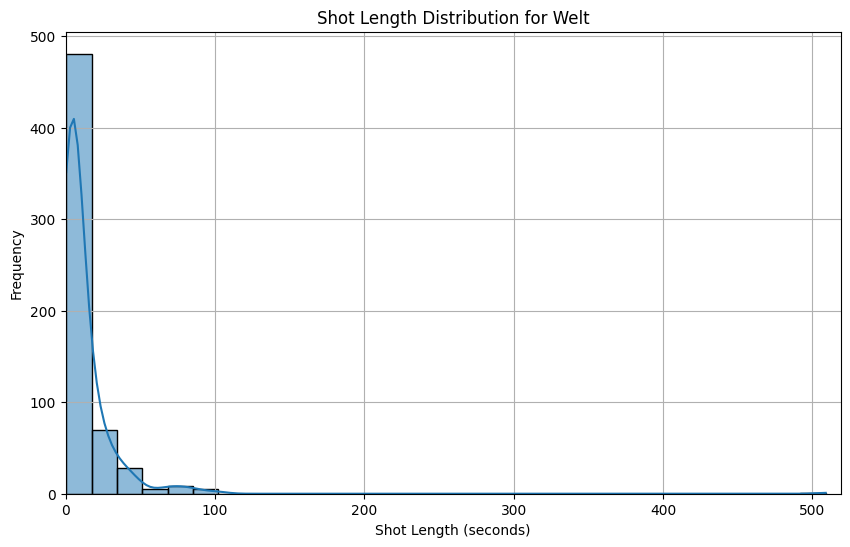

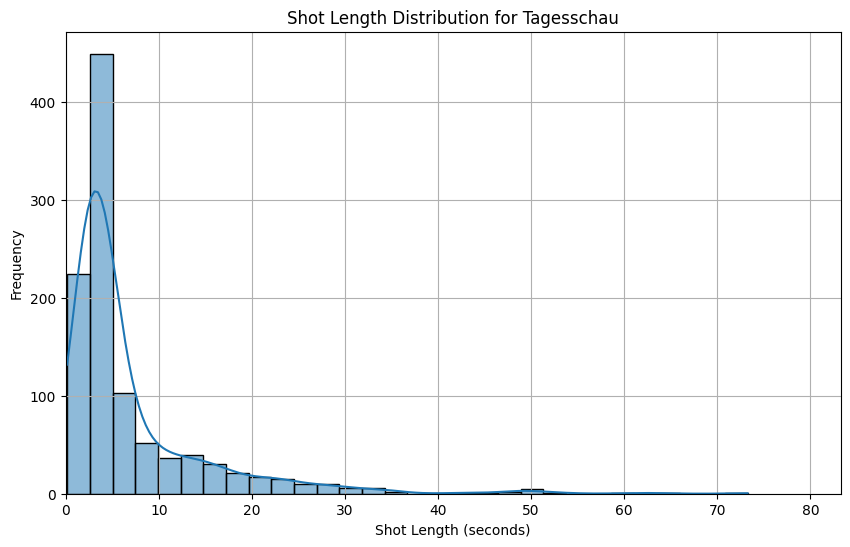

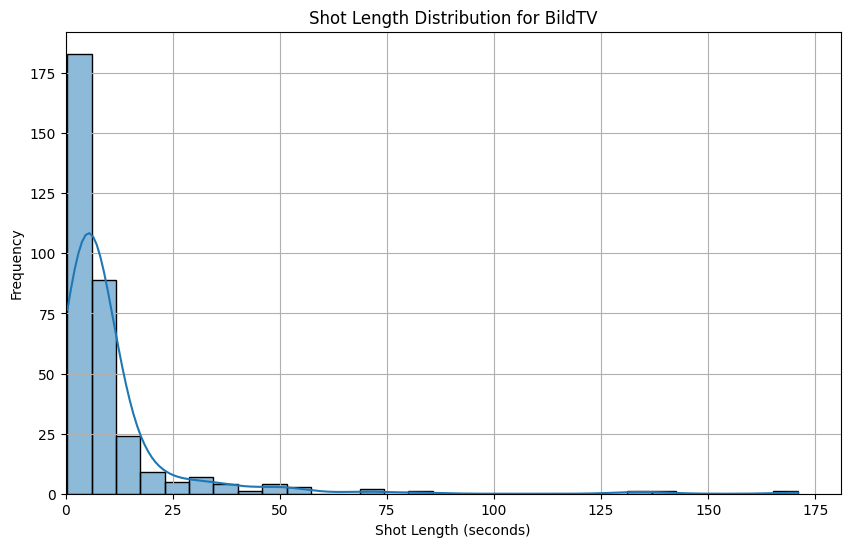

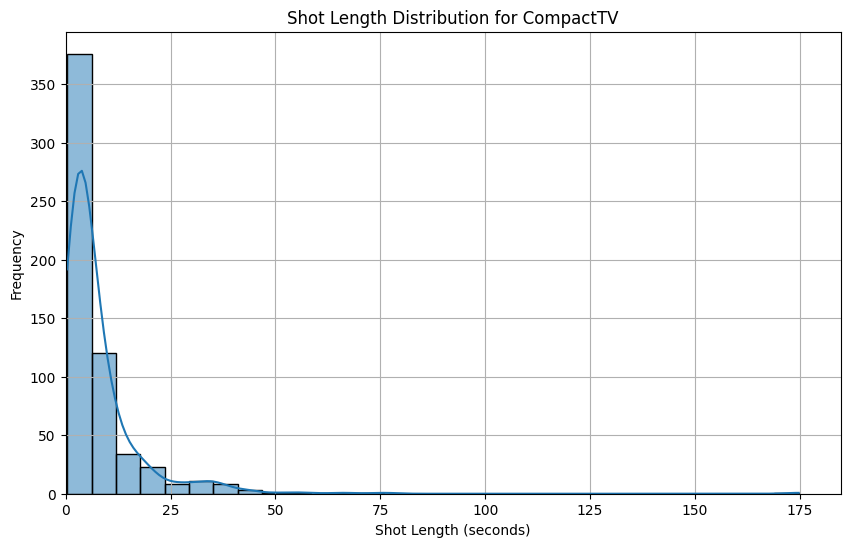

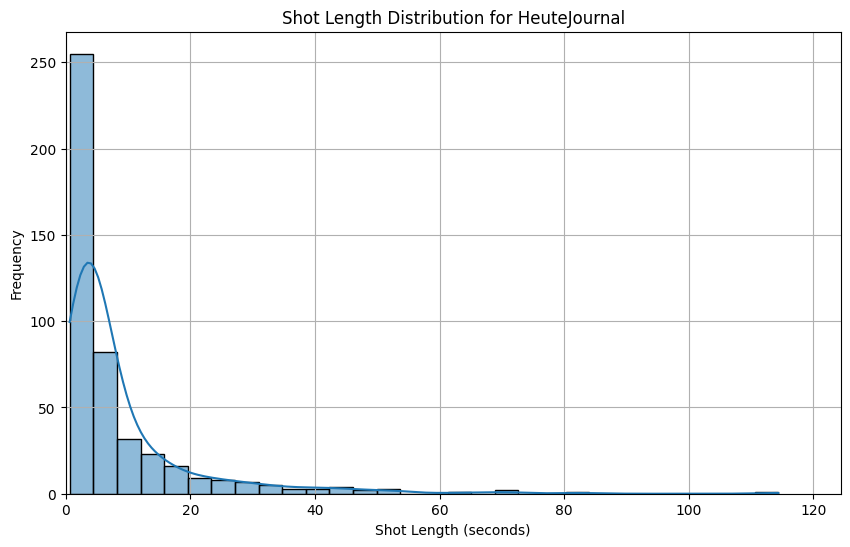

Mann-Whitney U test between Welt and Tagesschau: U-statistic = 358848.5, p-value = 6.090458317650157e-08
The difference in shot lengths between Welt and Tagesschau is statistically significant.


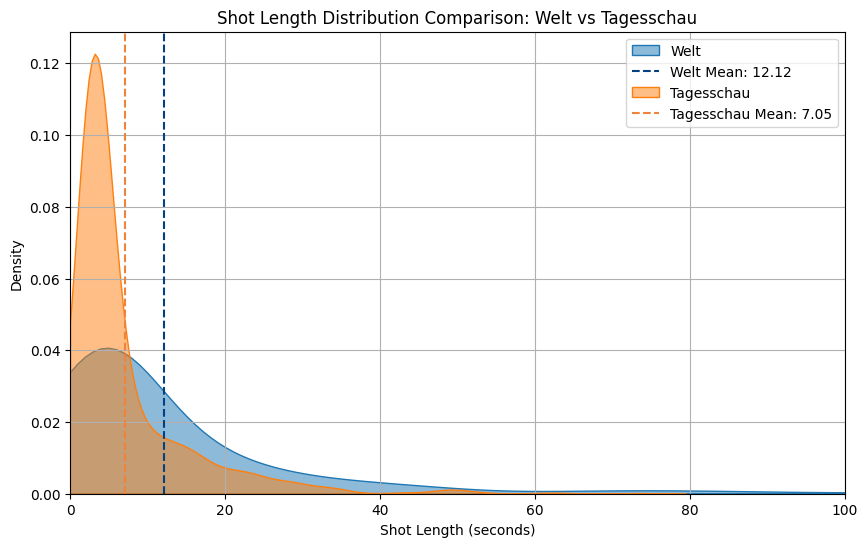

Mann-Whitney U test between Welt and BildTV: U-statistic = 92205.5, p-value = 0.04384109439937203
The difference in shot lengths between Welt and BildTV is statistically significant.


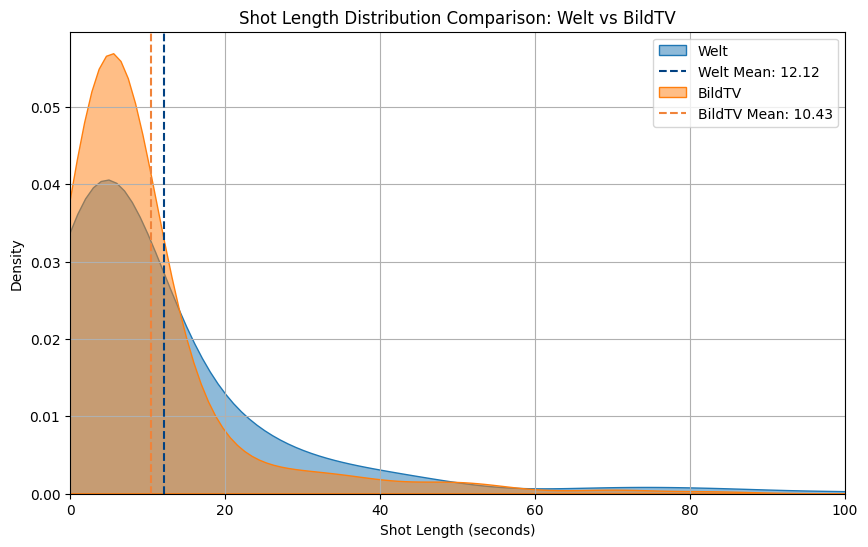

Mann-Whitney U test between Welt and CompactTV: U-statistic = 199207.5, p-value = 7.28158232754273e-05
The difference in shot lengths between Welt and CompactTV is statistically significant.


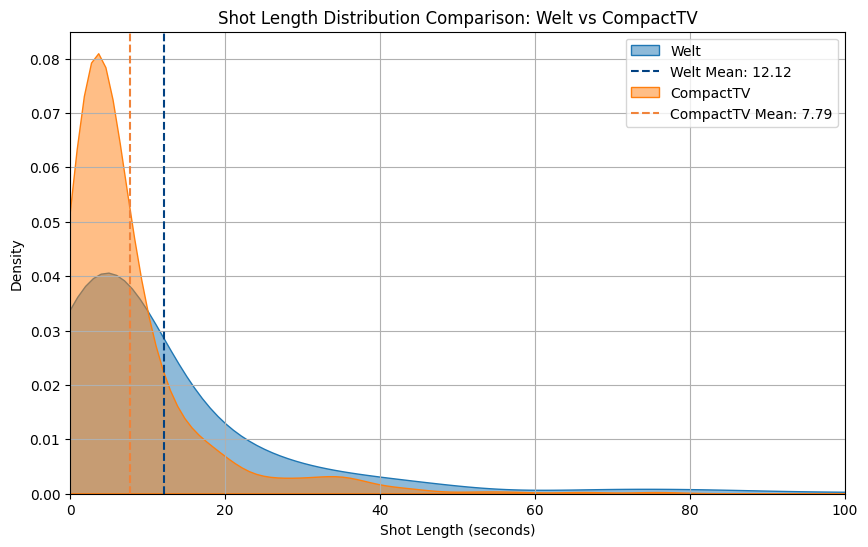

Mann-Whitney U test between Welt and HeuteJournal: U-statistic = 150731.5, p-value = 0.004068873011364489
The difference in shot lengths between Welt and HeuteJournal is statistically significant.


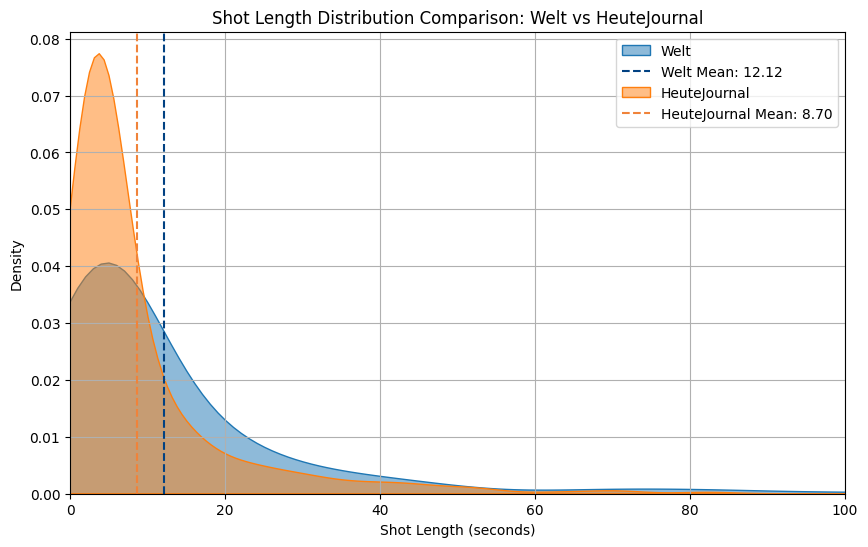

Mann-Whitney U test between Tagesschau and BildTV: U-statistic = 125927.5, p-value = 5.6308793764470385e-14
The difference in shot lengths between Tagesschau and BildTV is statistically significant.


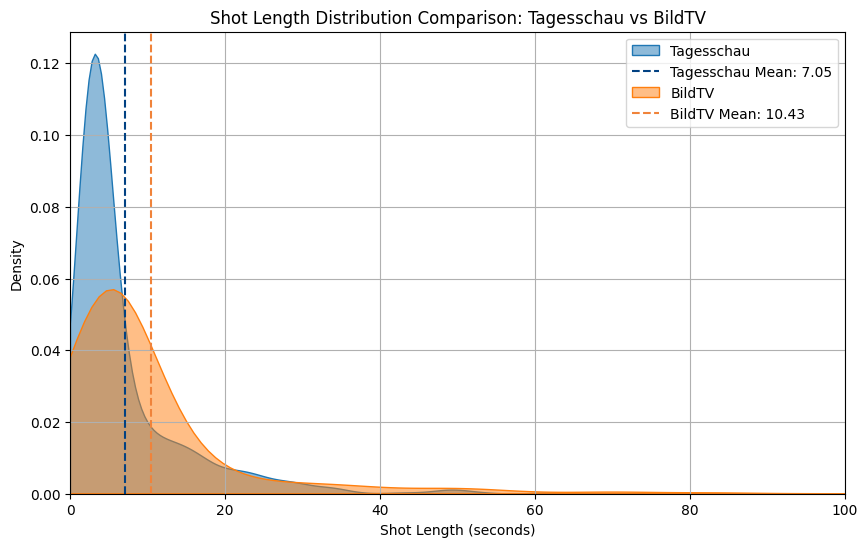

Mann-Whitney U test between Tagesschau and CompactTV: U-statistic = 296958.5, p-value = 0.437737137063568
The difference in shot lengths between Tagesschau and CompactTV is NOT statistically significant.


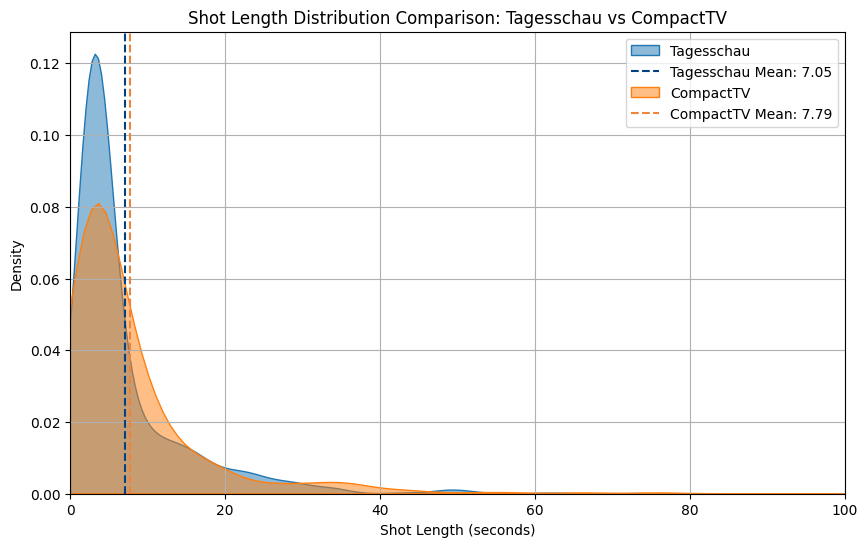

Mann-Whitney U test between Tagesschau and HeuteJournal: U-statistic = 222850.5, p-value = 0.08002013680249621
The difference in shot lengths between Tagesschau and HeuteJournal is NOT statistically significant.


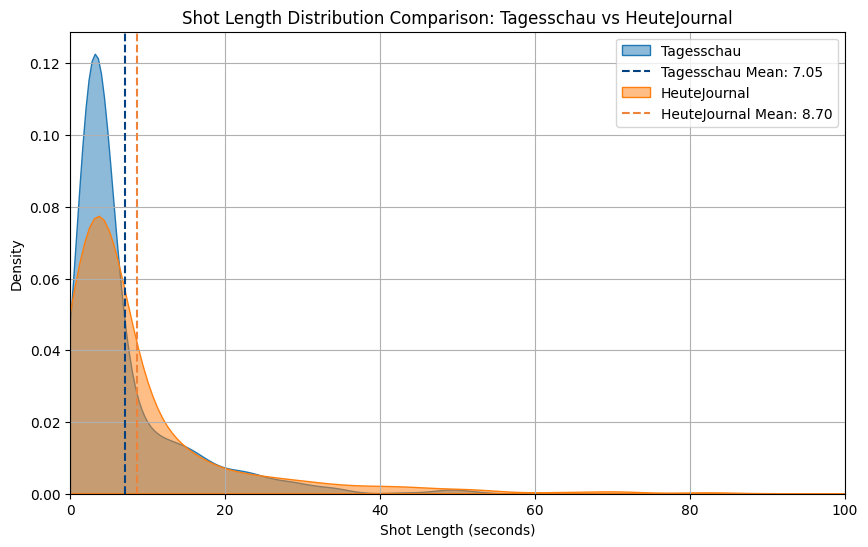

Mann-Whitney U test between BildTV and CompactTV: U-statistic = 118166.0, p-value = 4.369642466340917e-07
The difference in shot lengths between BildTV and CompactTV is statistically significant.


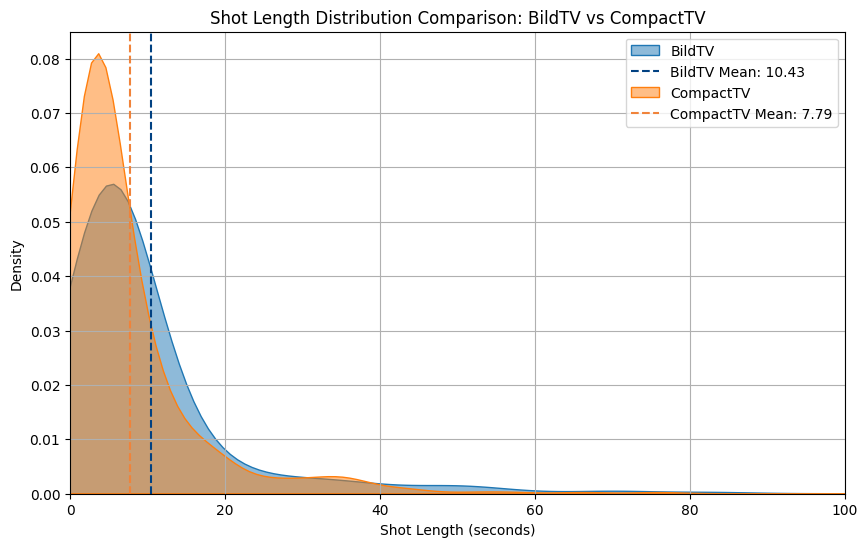

Mann-Whitney U test between BildTV and HeuteJournal: U-statistic = 91962.5, p-value = 1.2580839005006669e-06
The difference in shot lengths between BildTV and HeuteJournal is statistically significant.


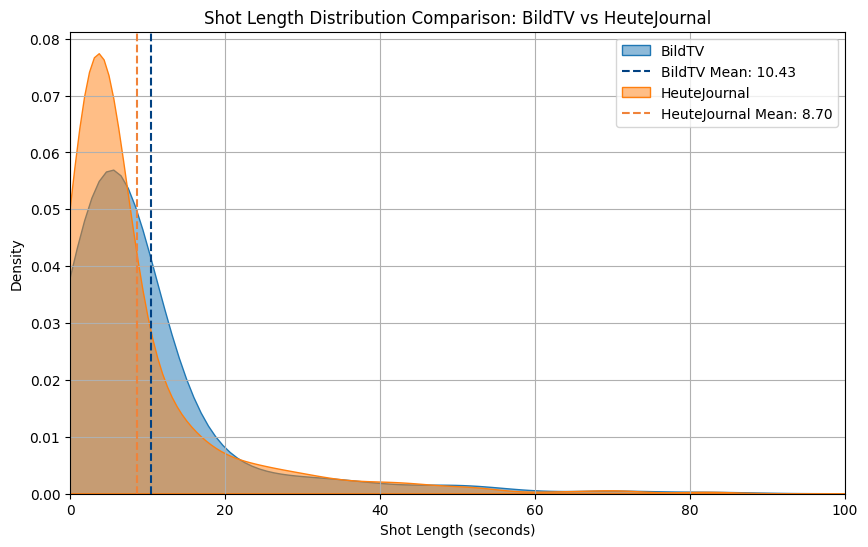

Mann-Whitney U test between CompactTV and HeuteJournal: U-statistic = 129965.5, p-value = 0.3641472231308318
The difference in shot lengths between CompactTV and HeuteJournal is NOT statistically significant.


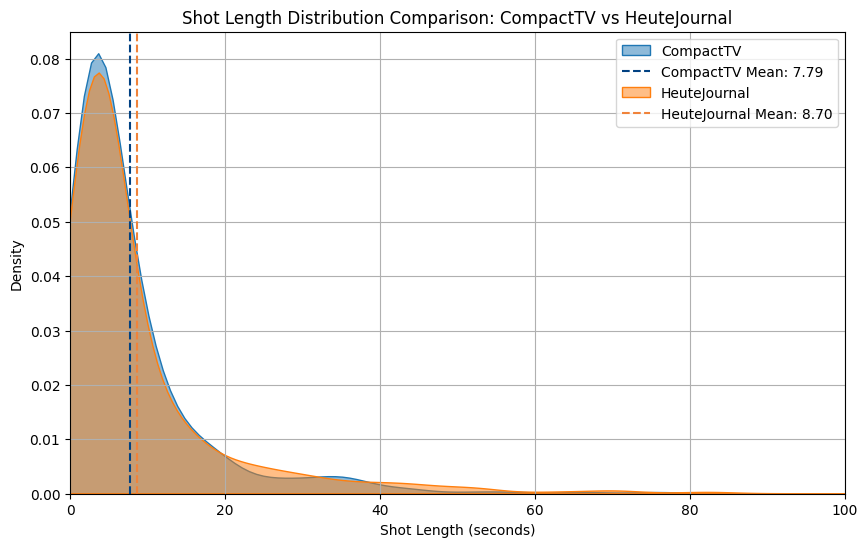

<Figure size 1000x600 with 0 Axes>

<Figure size 1000x600 with 0 Axes>

In [39]:
# calculatre whether the differences in shot length are significant or not
from scipy.stats import ttest_ind, mannwhitneyu
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
import statistics as stats
import os
import sys
import json
import matplotlib.pyplot as plt


def plot_shot_length_distribution(df, channel):
    # Filter the DataFrame for the specified channel
    df_channel = df[df["channel"] == channel]

    # Plot the distribution of shot lengths
    plt.figure(figsize=(10, 6))
    plt.xlim(0, df_channel["duration"].max() + 10)
    sns.histplot(df_channel["duration"], bins=30, kde=True)
    plt.title(f"Shot Length Distribution for {channel}")
    plt.xlabel("Shot Length (seconds)")
    plt.ylabel("Frequency")
    plt.grid()
    plt.show()

def compare_shot_lengths(df, channel1, channel2):
    # Filter the DataFrame for the specified channels
    df_channel1 = df[df["channel"] == channel1]
    df_channel2 = df[df["channel"] == channel2]

    # Perform t-test, not doing it with nthe dataframe, because it is not normally distributed, looks more like poisson distribution
    """
    t_stat, p_value_ttest = ttest_ind(df_channel1["duration"], df_channel2["duration"])
    print(f"T-test between {channel1} and {channel2}: t-statistic = {t_stat}, p-value = {p_value_ttest}")
    # Check if the p-value is significant (e.g., < 0.05)
    if p_value_ttest < 0.05:
        print(f"The difference in shot lengths between {channel1} and {channel2} is statistically significant.")
    else:
        print(f"The difference in shot lengths between {channel1} and {channel2} is NOT statistically significant.")"
    """

    # Perform Mann-Whitney U test
    u_stat, p_value_mannwhitney = mannwhitneyu(df_channel1["duration"], df_channel2["duration"])
    print(f"Mann-Whitney U test between {channel1} and {channel2}: U-statistic = {u_stat}, p-value = {p_value_mannwhitney}")
    # Check if the p-value is significant (e.g., < 0.05)
    if p_value_mannwhitney < 0.05:
        print(f"The difference in shot lengths between {channel1} and {channel2} is statistically significant.")
    else:
        print(f"The difference in shot lengths between {channel1} and {channel2} is NOT statistically significant.")
    # Plot the distributions
    plt.figure(figsize=(10, 6))

    # the kdeplot should only start at 0, so we need to set the xlim
    max = df["duration"].max()
    sns.kdeplot(df_channel1["duration"], label=channel1, fill=True, alpha=0.5, clip=(0, 200))
    # show mean
    mean_channel1 = df_channel1["duration"].mean()
    plt.axvline(mean_channel1, color=sns.xkcd_rgb['darkish blue'], linestyle='--', label=f"{channel1} Mean: {mean_channel1:.2f}")

    sns.kdeplot(df_channel2["duration"], label=channel2, fill=True, alpha=0.5, clip=(0, 200))
    # show mean
    mean_channel2 = df_channel2["duration"].mean()
    plt.axvline(mean_channel2, color=sns.xkcd_rgb['dusty orange'], linestyle='--', label=f"{channel2} Mean: {mean_channel2:.2f}")

 

    plt.title(f"Shot Length Distribution Comparison: {channel1} vs {channel2}")
    plt.xlim(0, 100)
    plt.xlabel("Shot Length (seconds)")
    plt.ylabel("Density")
    plt.legend()
    plt.grid()
    plt.show()
    plt.savefig(f"shot_length_distribution_{channel1}_{channel2}.png", dpi=300)
    plt.close()

# Example usage
plot_shot_length_distribution(df, "Welt")
plot_shot_length_distribution(df, "Tagesschau")
plot_shot_length_distribution(df, "BildTV")
plot_shot_length_distribution(df, "CompactTV")
plot_shot_length_distribution(df, "HeuteJournal")
compare_shot_lengths(df, "Welt", "Tagesschau")
compare_shot_lengths(df, "Welt", "BildTV")
compare_shot_lengths(df, "Welt", "CompactTV")
compare_shot_lengths(df, "Welt", "HeuteJournal")
compare_shot_lengths(df, "Tagesschau", "BildTV")
compare_shot_lengths(df, "Tagesschau", "CompactTV")
compare_shot_lengths(df, "Tagesschau", "HeuteJournal")
compare_shot_lengths(df, "BildTV", "CompactTV")
compare_shot_lengths(df, "BildTV", "HeuteJournal")
compare_shot_lengths(df, "CompactTV", "HeuteJournal")
# Plot the distribution of shot lengths for each channel
plt.figure(figsize=(10, 6))

Mann-Whitney U test between fragmentation and not fragmentation: U-statistic = 280058.0, p-value = 0.3023380551537955
The difference in shot lengths is NOT statistically significant for fragmentation.


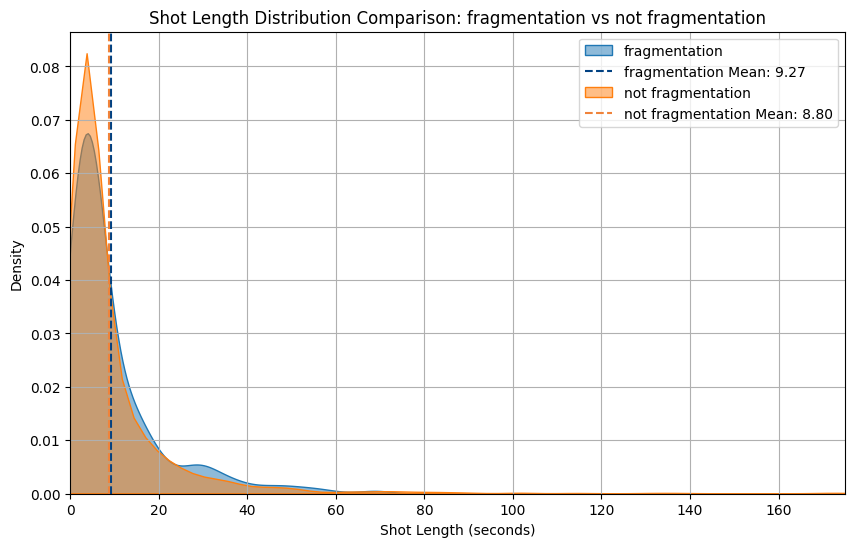

Mann-Whitney U test between individualization_of_elite and not individualization_of_elite: U-statistic = 136148.5, p-value = 0.19374127512161554
The difference in shot lengths is NOT statistically significant for individualization_of_elite.


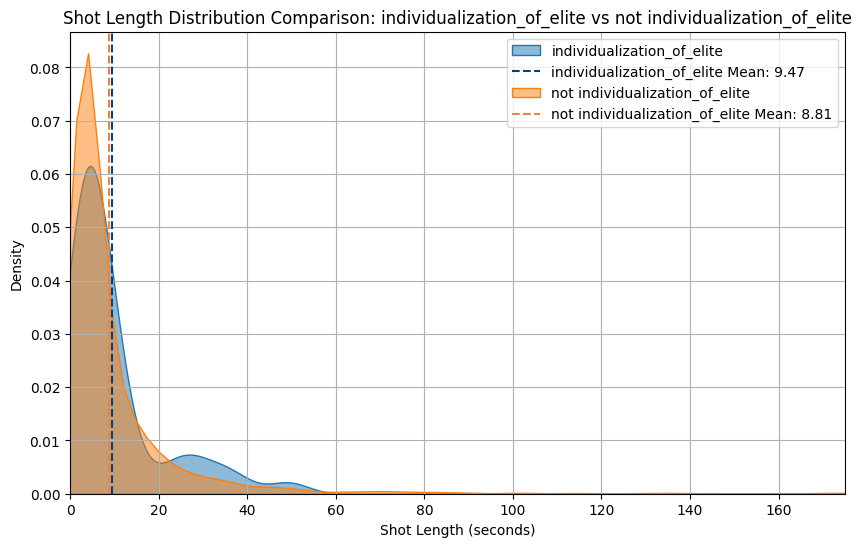

Mann-Whitney U test between individualization_of_reporter and not individualization_of_reporter: U-statistic = 128663.5, p-value = 1.0880568993744145e-12
Effect size (median difference): 11.10
The difference in shot lengths is statistically significant for individualization_of_reporter.


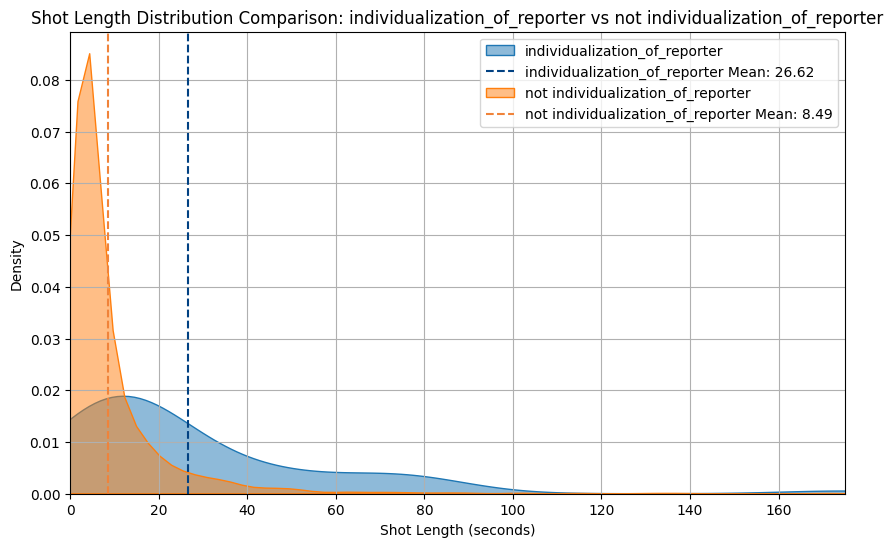

Mann-Whitney U test between individualization_of_layperson and not individualization_of_layperson: U-statistic = 72504.0, p-value = 0.6259996605954756
The difference in shot lengths is NOT statistically significant for individualization_of_layperson.


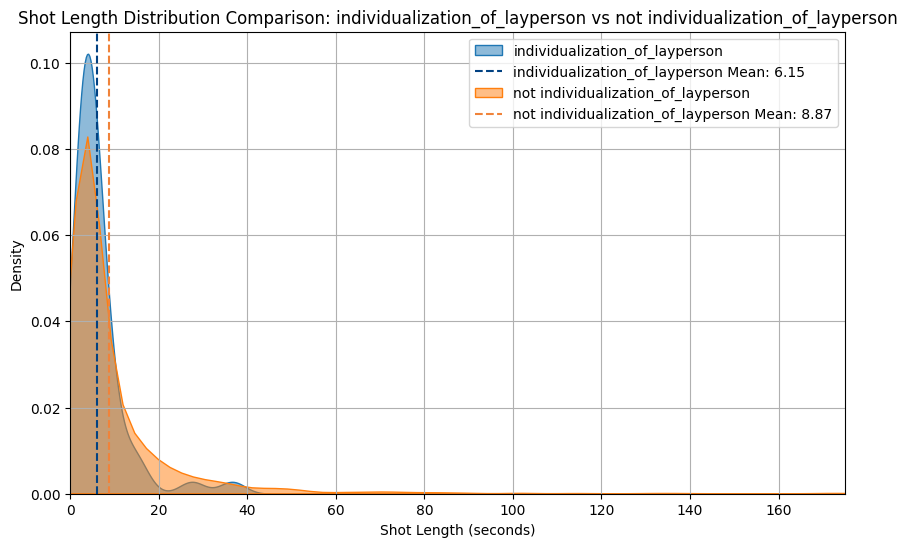

Mann-Whitney U test between fragmentation_splitscreen and not fragmentation_splitscreen: U-statistic = 341819.5, p-value = 8.942857228939182e-11
Effect size (median difference): 1.48
The difference in shot lengths is statistically significant for fragmentation_splitscreen.


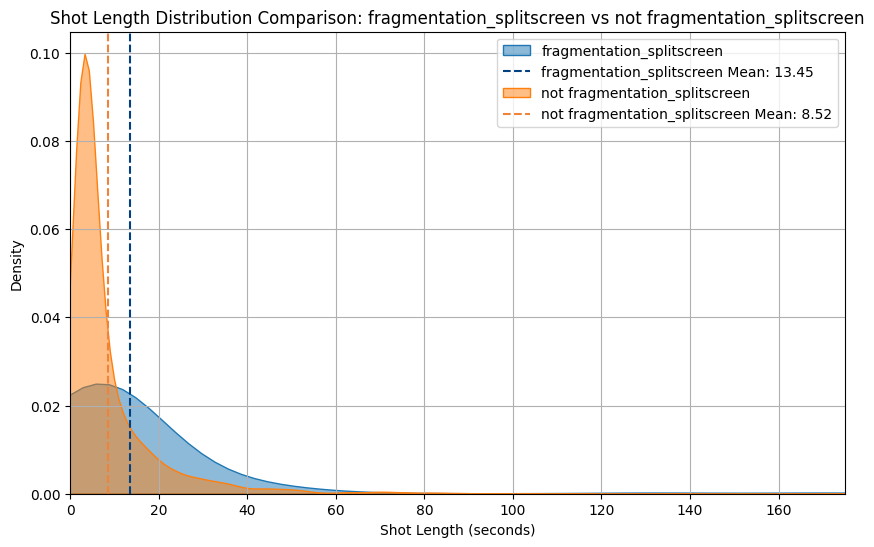

Mann-Whitney U test between emotionalization and not emotionalization: U-statistic = 325275.0, p-value = 0.1752519144994208
The difference in shot lengths is NOT statistically significant for emotionalization.


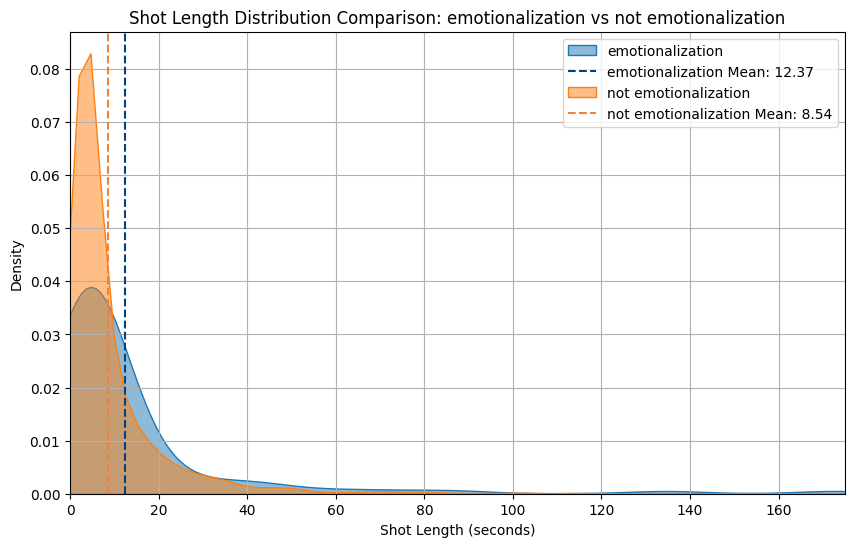

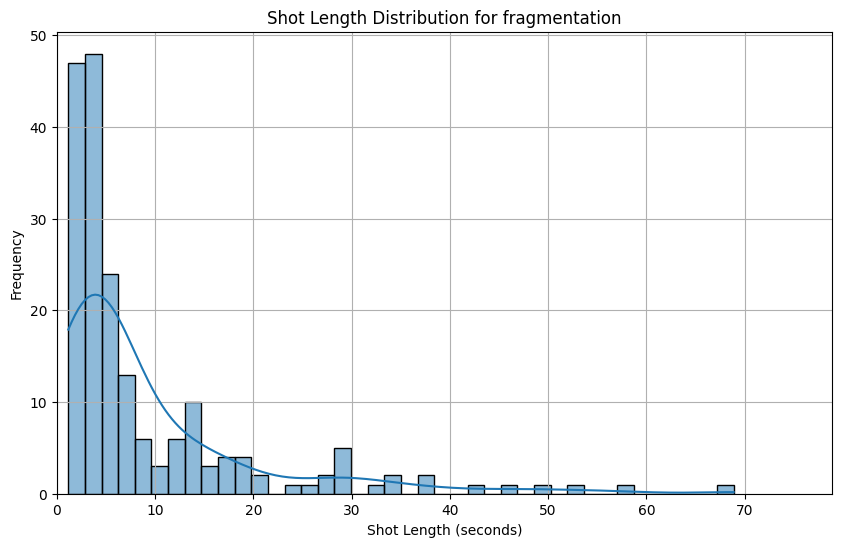

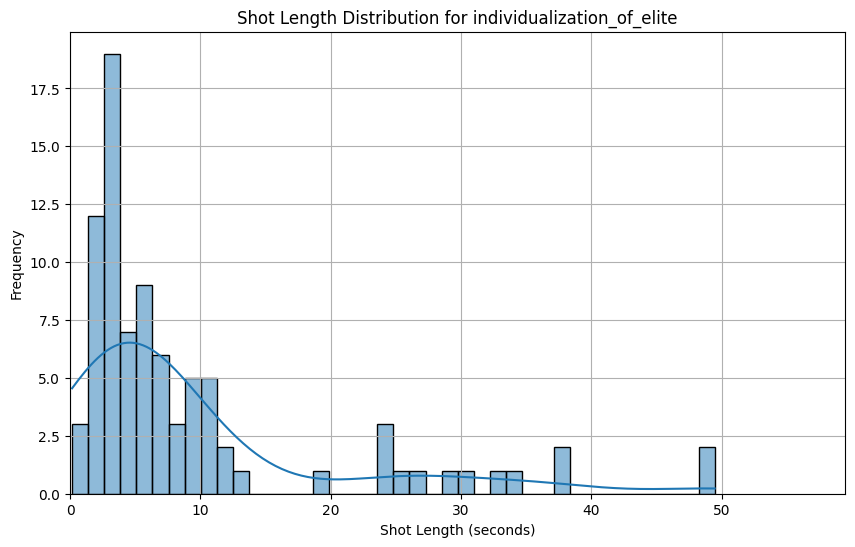

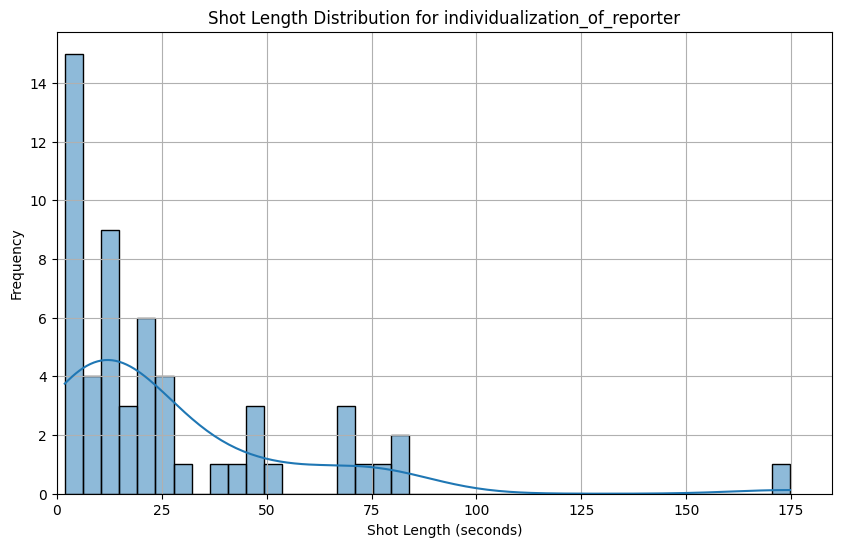

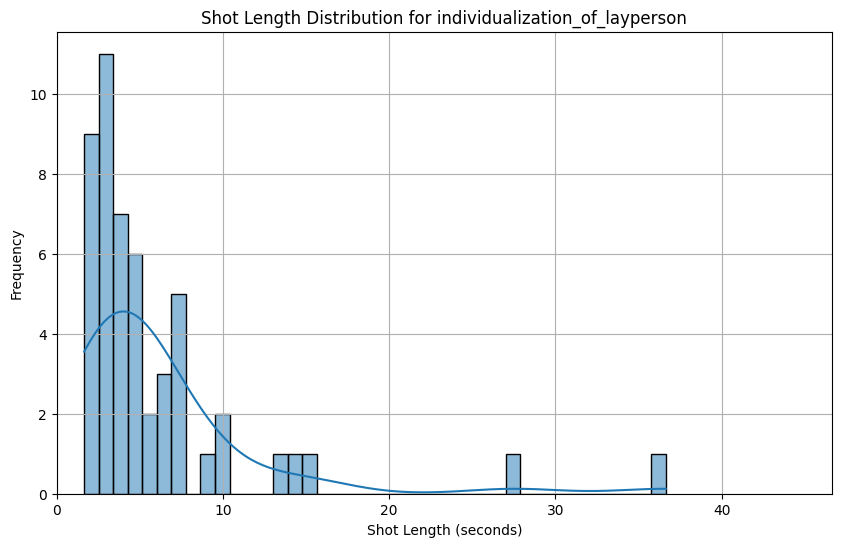

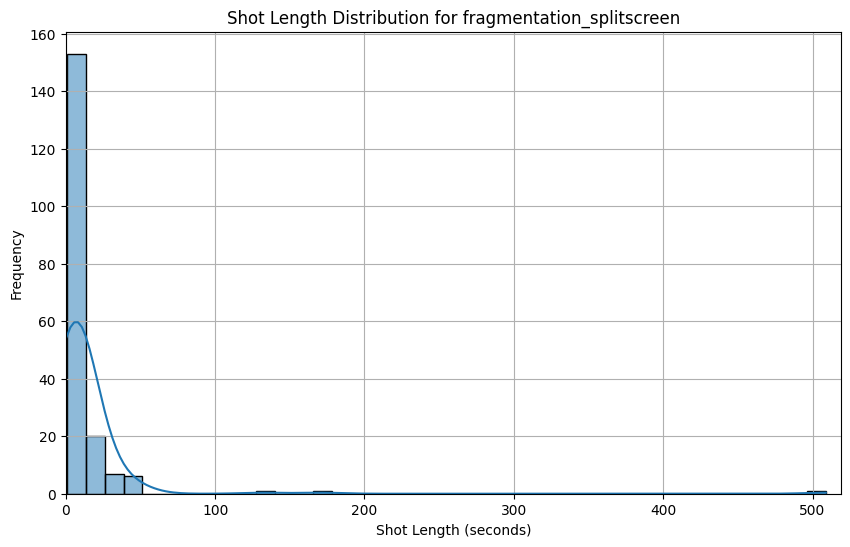

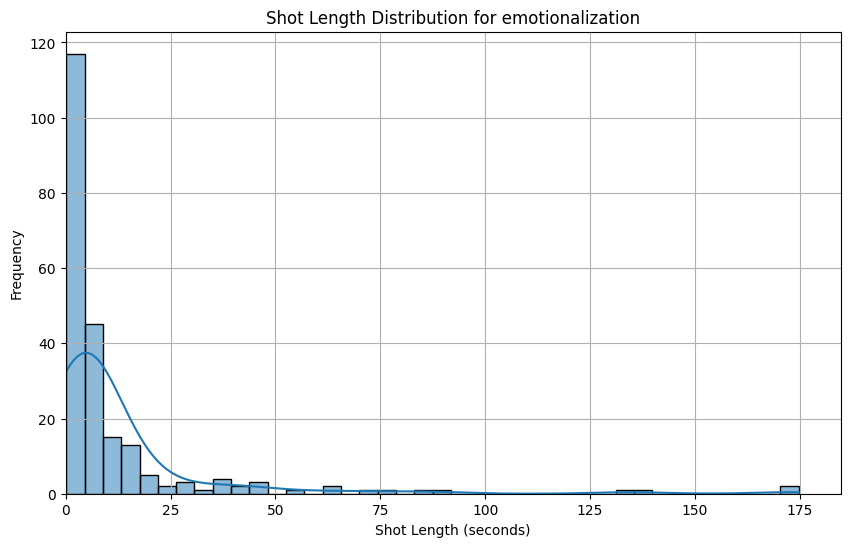

In [ ]:
# significant shot length differences by pattern

def plot_shot_length_by_pattern(df, pattern_col):
    df_pattern  = df[df[pattern_col] == 1]
     # Plot the distribution of shot lengths
    plt.figure(figsize=(10, 6))
    plt.xlim(0, df_pattern["duration"].max() + 10)
    sns.histplot(df_pattern["duration"], bins=40, kde=True)
    plt.title(f"Shot Length Distribution for {pattern_col}")
    plt.xlabel("Shot Length (seconds)")
    plt.ylabel("Frequency")
    plt.grid()
    plt.show()


def compare_shot_lengthsp(df, pattern_col):
    # Filter the DataFrame for the specified channels
    df_pattern  = df[df[pattern_col] == 1]
    df_not_pattern = df[df[pattern_col] == 0]

    # Perform t-test
    """
    t_stat, p_value_ttest = ttest_ind(df_pattern["duration"], df_not_pattern["duration"])
    print(f"T-test between {pattern_col} and not {pattern_col}: t-statistic = {t_stat}, p-value = {p_value_ttest}")
    significant = p_value_ttest < 0.05
    if significant:
        print(f"The difference in shot lengths is statistically significant for {pattern_col}.")
    else:
        print(f"The difference in shot lengths is NOT statistically significant for {pattern_col}.")"
        """
   

    # Perform Mann-Whitney U test
    u_stat, p_value_mannwhitney = mannwhitneyu(df_pattern["duration"], df_not_pattern["duration"])
    print(f"Mann-Whitney U test between {pattern_col} and not {pattern_col}: U-statistic = {u_stat}, p-value = {p_value_mannwhitney}")
    significant = p_value_mannwhitney < 0.05
    if significant:
        effect_size = stats.median(df_pattern["duration"]) - stats.median(df_not_pattern["duration"])
        print(f"Effect size (median difference): {effect_size:.2f}")
        print(f"The difference in shot lengths is statistically significant for {pattern_col}.")

    else:
        print(f"The difference in shot lengths is NOT statistically significant for {pattern_col}.")
   
    # Plot the distributions
    plt.figure(figsize=(10, 6))
    sns.kdeplot(df_pattern["duration"], label=pattern_col, fill=True, alpha=0.5)
    # show mean
    mean_pattern = df_pattern["duration"].mean()
    plt.axvline(mean_pattern, color=sns.xkcd_rgb['darkish blue'], linestyle='--', label=f"{pattern_col} Mean: {mean_pattern:.2f}")
    sns.kdeplot(df_not_pattern["duration"], label=f"not {pattern_col}", fill=True, alpha=0.5)
    # show mean
    mean_not_pattern = df_not_pattern["duration"].mean()
    plt.axvline(mean_not_pattern, color=sns.xkcd_rgb['dusty orange'], linestyle='--', label=f"not {pattern_col} Mean: {mean_not_pattern:.2f}")
    plt.xlim(0, 175)
    plt.title(f"Shot Length Distribution Comparison: {pattern_col} vs not {pattern_col}")
    plt.xlabel("Shot Length (seconds)")
    plt.ylabel("Density")
    plt.legend()
    plt.grid()
    plt.show()
    plt.savefig(f"shot_length_distribution_{pattern_col}.png", dpi=300)
    plt.close()


compare_shot_lengthsp(df, "fragmentation")
compare_shot_lengthsp(df, "individualization_of_elite")
compare_shot_lengthsp(df, "individualization_of_reporter")
compare_shot_lengthsp(df, "individualization_of_layperson")
compare_shot_lengthsp(df, "fragmentation_splitscreen")
compare_shot_lengthsp(df, "emotionalization")
# Example usage
plot_shot_length_by_pattern(df, "fragmentation")
plot_shot_length_by_pattern(df, "individualization_of_elite")
plot_shot_length_by_pattern(df, "individualization_of_reporter")
plot_shot_length_by_pattern(df, "individualization_of_layperson")
plot_shot_length_by_pattern(df, "fragmentation_splitscreen")
plot_shot_length_by_pattern(df, "emotionalization")




Overall mean shot length: 8.82545849933599
Overall median shot length: 4.2399999999999665
Overall std shot length: 15.385611921441877
Mann-Whitney U test between alternating-shot and not alternating-shot: U-statistic = 479347.5, p-value = 8.94697690002955e-06
Effect size (median difference): 0.88
The difference in shot lengths is statistically significant for alternating-shot.


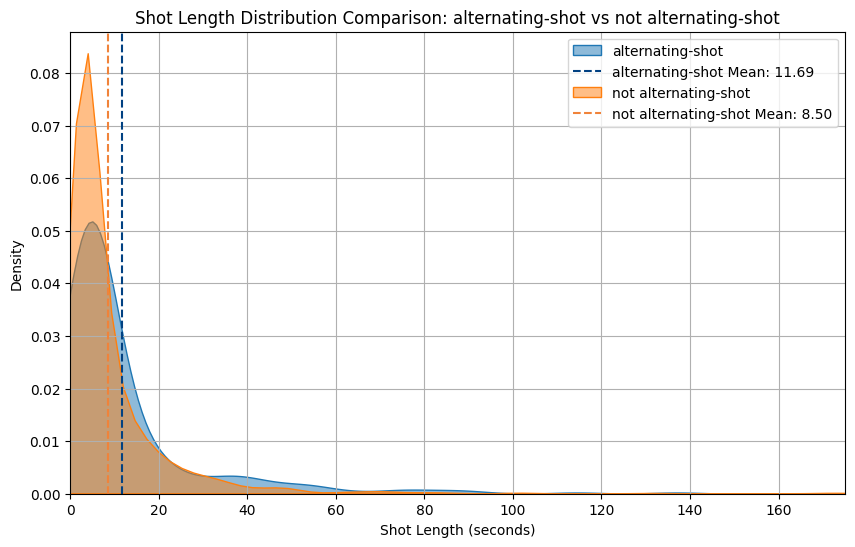

Mann-Whitney U test between shot-reverse-shot and not shot-reverse-shot: U-statistic = 369874.0, p-value = 8.138015021942511e-05
Effect size (median difference): 2.08
The difference in shot lengths is statistically significant for shot-reverse-shot.


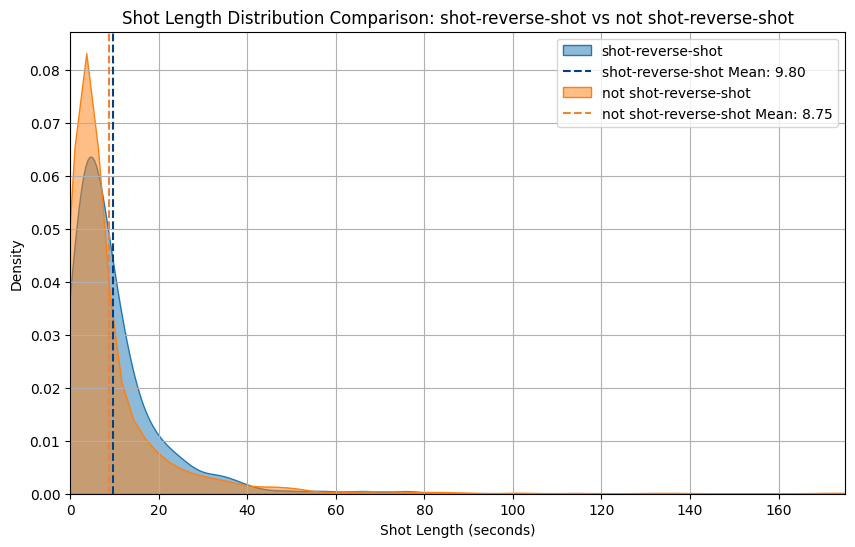

Mann-Whitney U test between cut-in and not cut-in: U-statistic = 48453.0, p-value = 0.02434844944921567
Effect size (median difference): 0.92
The difference in shot lengths is statistically significant for cut-in.


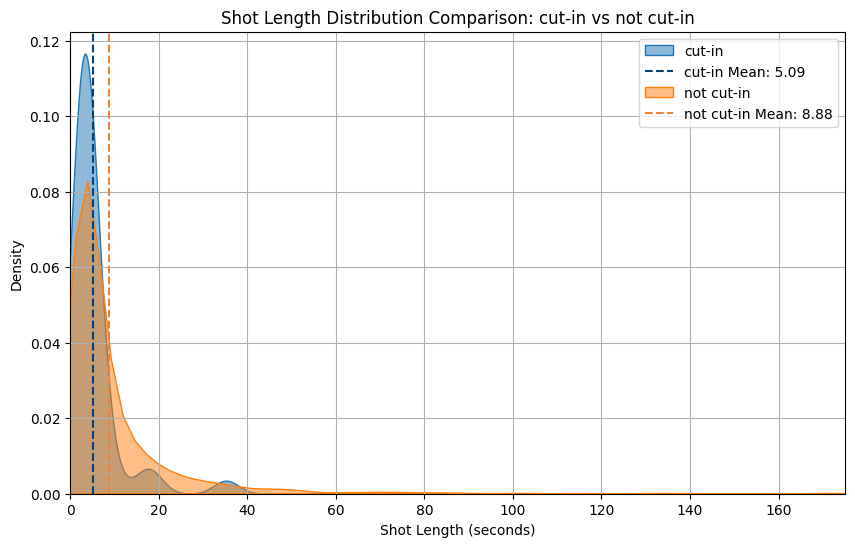

Mann-Whitney U test between intensify and not intensify: U-statistic = 138642.5, p-value = 3.396580781350396e-06
Effect size (median difference): 1.00
The difference in shot lengths is statistically significant for intensify.


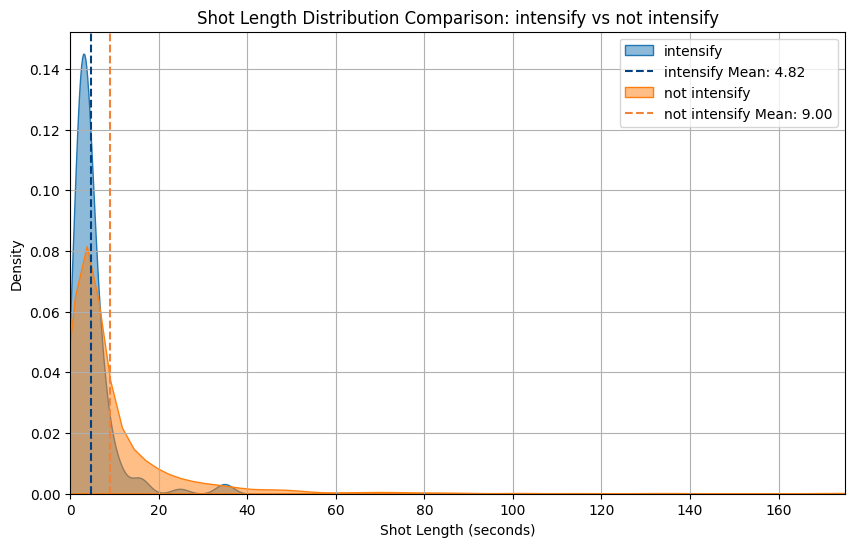

Mann-Whitney U test between cut-away and not cut-away: U-statistic = 159374.5, p-value = 0.4402407716929577
The difference in shot lengths is NOT statistically significant for cut-away.


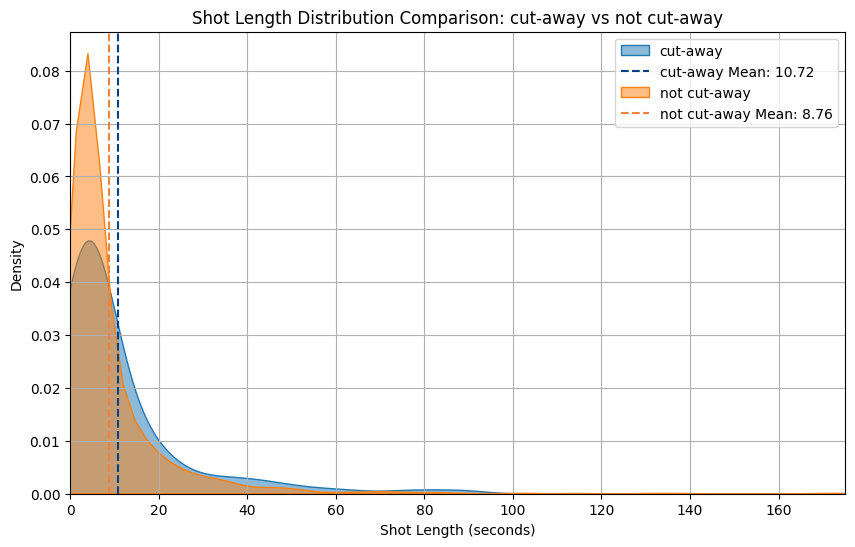

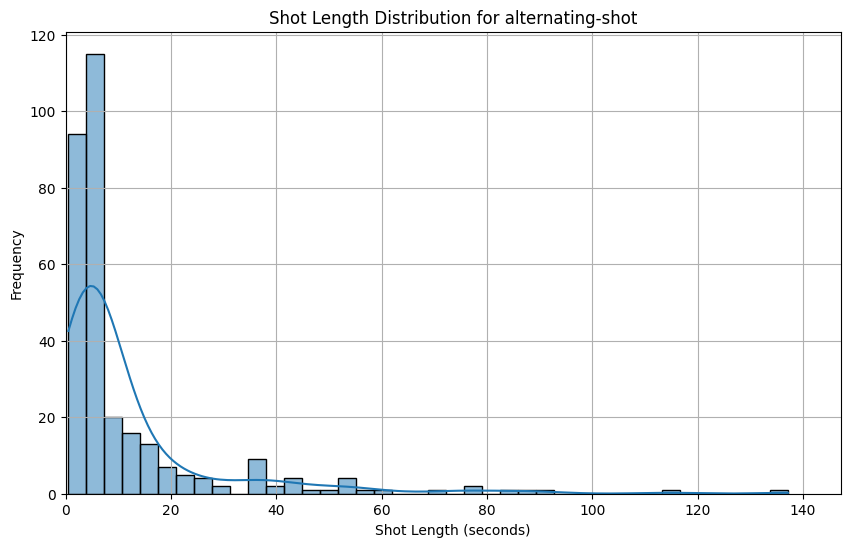

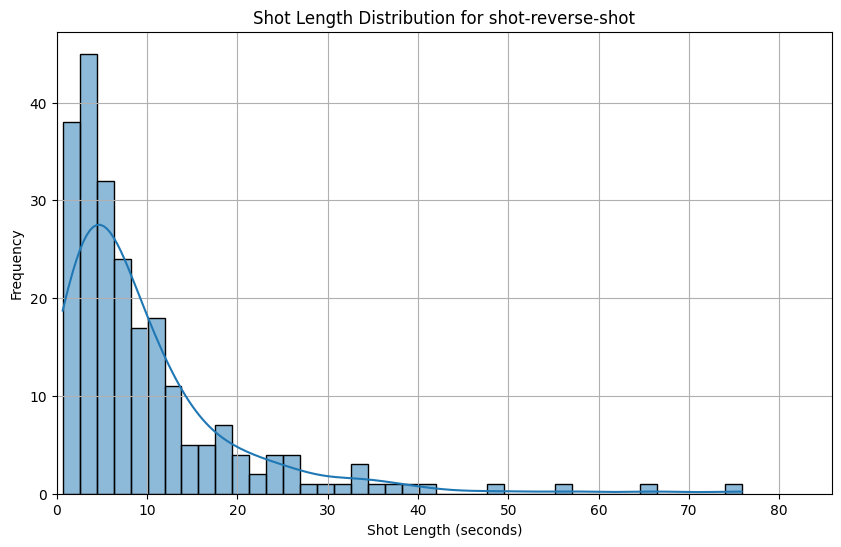

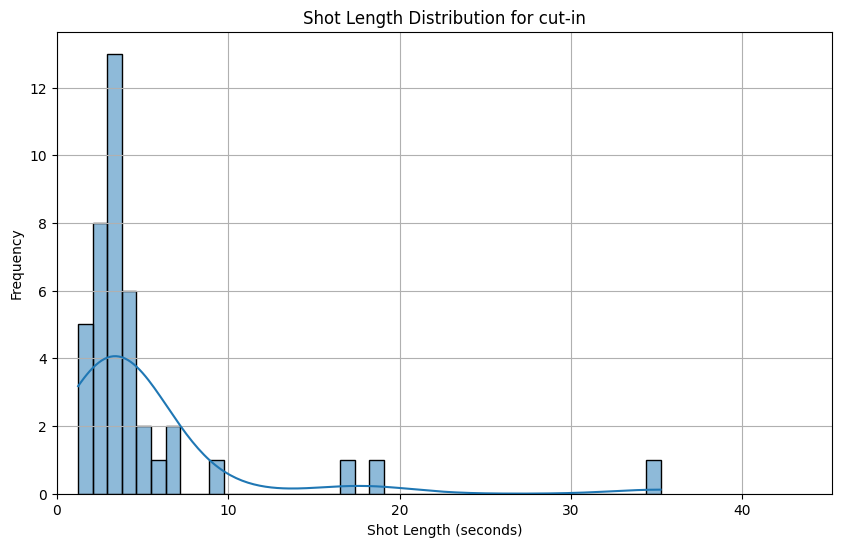

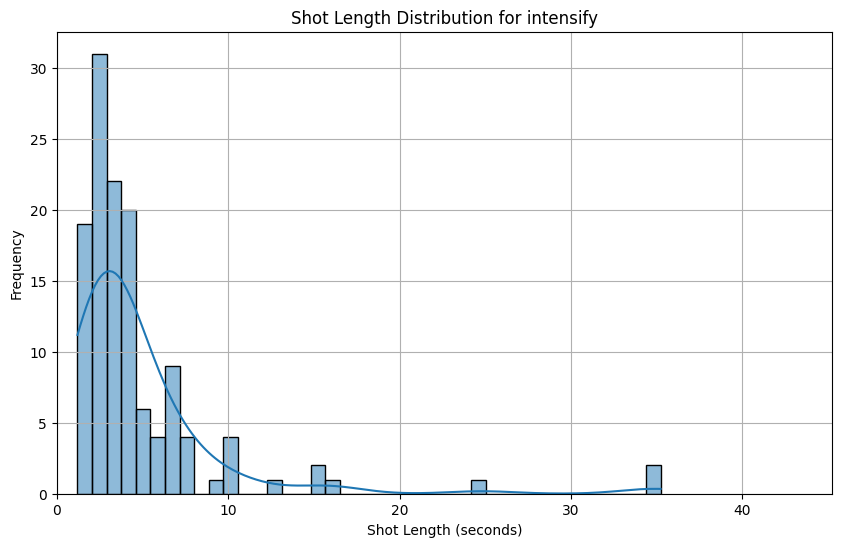

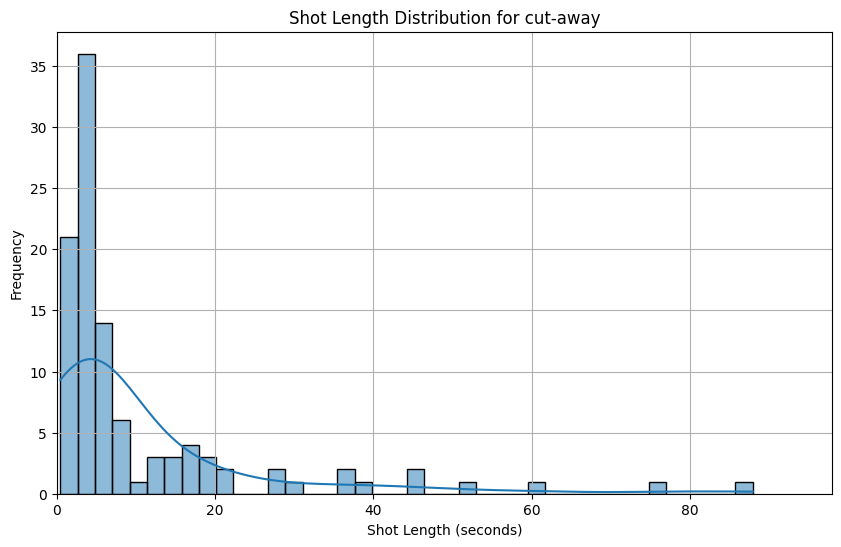

In [44]:
# for feps

all_shot_mean = df["duration"].mean()
all_shot_median = df["duration"].median()
all_shot_std = df["duration"].std()
print("Overall mean shot length:", all_shot_mean)
print("Overall median shot length:", all_shot_median)
print("Overall std shot length:", all_shot_std)


compare_shot_lengthsp(df, "alternating-shot")
compare_shot_lengthsp(df, "shot-reverse-shot")
compare_shot_lengthsp(df, "cut-in")
compare_shot_lengthsp(df, "intensify")
compare_shot_lengthsp(df, "cut-away")


plot_shot_length_by_pattern(df, "alternating-shot")
plot_shot_length_by_pattern(df, "shot-reverse-shot")
plot_shot_length_by_pattern(df, "cut-in")
plot_shot_length_by_pattern(df, "intensify")
plot_shot_length_by_pattern(df, "cut-away")

<Figure size 640x480 with 0 Axes>

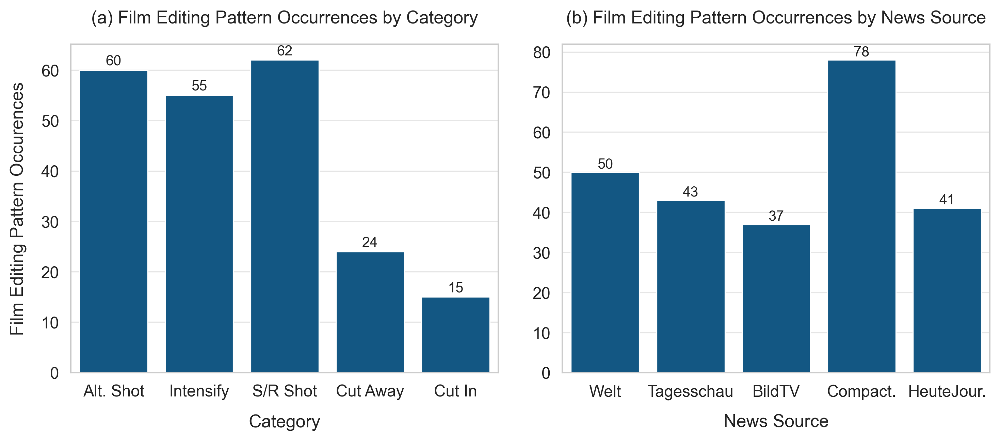

In [35]:

import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

# ----------------------
# Increase font scale
# ----------------------
# "paper" context is fairly small by default. Increase font_scale to make text bigger.
sns.set_context("paper", font_scale=1.3)

# Keep the whitegrid style and lightened edges
sns.set_style("whitegrid", {
    'grid.color': '.9',
    'axes.edgecolor': '.8'
})
sns.despine()

# ----------------------
# Example data
# ----------------------
overall_feps = {
    'alternating-shot': 60, 
    'intensify': 55, 
    'shot-reverse-shot': 62,
    'cut-away': 24,
    'cut-in': 15
}
categories = ["Alt. Shot", "Intensify", "S/R Shot", "Cut Away", "Cut In"]
counts = [overall_feps[key] for key in overall_feps]

df_tot_feps = pd.DataFrame({
    'NewsSource': ['Welt','Tagesschau','BildTV','Compact.','HeuteJour.'],
    'total_feps': [50, 43, 37, 78, 41]
})

# ----------------------
# Adjust figure size
# ----------------------
# A slightly less wide figure, so it doesn't get shrunk as much by LaTeX
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4.5), dpi=300)

# ----------------------
# Left subplot
# ----------------------
sns.barplot(ax=axes[0], x=categories, y=counts, color="#005B96")
axes[0].set_title("(a) Film Editing Pattern Occurrences by Category", pad=15)
axes[0].set_xlabel("Category", labelpad=10)
axes[0].set_ylabel("Film Editing Pattern Occurences", labelpad=10)

for i, val in enumerate(counts):
    axes[0].text(i, val + 1, str(val), ha='center', fontsize=10)

# ----------------------
# Right subplot
# ----------------------
sns.barplot(ax=axes[1], data=df_tot_feps, x="NewsSource", y="total_feps", color="#005B96")
axes[1].set_title("(b) Film Editing Pattern Occurrences by News Source", pad=15)
axes[1].set_xlabel("News Source", labelpad=10)
# Optionally remove the second Y label to avoid redundancy
axes[1].set_ylabel(None)

for i, val in enumerate(df_tot_feps["total_feps"]):
    axes[1].text(i, val + 1, str(val), ha='center', fontsize=10)

# ----------------------
# Spacing & save
# ----------------------
plt.tight_layout()
plt.subplots_adjust(wspace=0.15)  # more horizontal space
plt.savefig("plots/FEP_side_by_side_thesis.png", bbox_inches='tight')
plt.show()
plt.close()


C:\Users\Lea\AppData\Local\Temp\ipykernel_19148\2983858071.py:65: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0].set_xticklabels(axes[0].get_xticklabels())
C:\Users\Lea\AppData\Local\Temp\ipykernel_19148\2983858071.py:82: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels())


<Figure size 640x480 with 0 Axes>

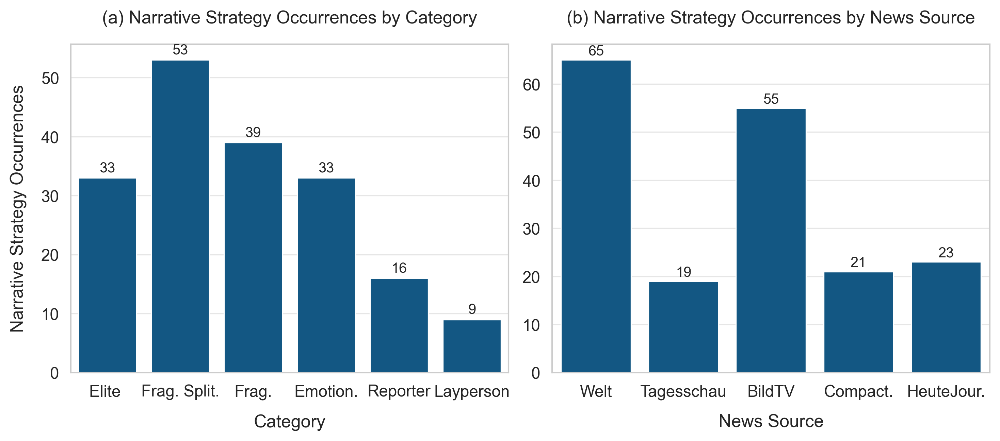

In [85]:
import matplotlib.pyplot as plt
import seaborn as sns

# ----------------------------------------
# Style (same as FEP subplot)
# ----------------------------------------
sns.set_context("paper", font_scale=1.3)
sns.set_style("whitegrid", {
    'grid.color': '.9',
    'axes.edgecolor': '.8'
})
sns.despine()

# ----------------------------------------
# Prepare data
# ----------------------------------------
strat_cols = [
    "individualization_of_elite",
    "fragmentation_splitscreen",
    "fragmentation",
    "emotionalization",
    "individualization_of_reporter",
    "individualization_of_layperson",
]

# Rename categories for display
strat_label_map = {
    "individualization_of_elite": "Elite ",
    "fragmentation_splitscreen": "Frag. Split.",
    "fragmentation": "Frag.",
    "emotionalization": "Emotion.",
    "individualization_of_reporter": "Reporter",
    "individualization_of_layperson": "Layperson"
}

News_source_label_map = {
    "Welt": "Welt",
    "Tagesschau": "Tagesschau",
    "BildTV": "BildTV",
    "CompactTV": "Compact.",
    "HeuteJournal": "HeuteJour."
}
# 1) Overall strategies
overall_strats = df.loc["Overall", strat_cols]
overall_strats.index = [strat_label_map[col] for col in overall_strats.index]


# 2) Total strategies by source
df_tot_strats = (
    df.loc[df.index != "Overall", "total_strategies"]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)

# ----------------------------------------
# Plot
# ----------------------------------------
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4.5), dpi=300)

# --- Left plot: overall strategy count by category
sns.barplot(ax=axes[0], x=overall_strats.index, y=overall_strats.values, color="#005B96")
axes[0].set_title("(a) Narrative Strategy Occurrences by Category", pad=15)
axes[0].set_xlabel("Category", labelpad=10)
axes[0].set_ylabel("Narrative Strategy Occurrences", labelpad=10)
axes[0].set_xticklabels(axes[0].get_xticklabels())
for i, val in enumerate(overall_strats.values):
    axes[0].text(i, val + 1, str(val), ha='center', fontsize=10)

# 2) Total strategies by source
df_tot_strats = (
    df.loc[df.index != "Overall", "total_strategies"]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)
df_tot_strats["NewsSource"] = df_tot_strats["NewsSource"].map(News_source_label_map)

# --- Right plot: total strategies per news source
sns.barplot(ax=axes[1], data=df_tot_strats, x="NewsSource", y="total_strategies", color="#005B96")
axes[1].set_title("(b) Narrative Strategy Occurrences by News Source", pad=15)
axes[1].set_xlabel("News Source", labelpad=10)
axes[1].set_ylabel(None)  # avoid redundancy
axes[1].set_xticklabels(axes[1].get_xticklabels())
for i, val in enumerate(df_tot_strats["total_strategies"]):
    axes[1].text(i, val + 1, str(val), ha='center', fontsize=10)

# Final layout
plt.tight_layout()
plt.subplots_adjust(wspace=0.1)
plt.savefig("plots/Strategies_side_by_side_thesis.png", bbox_inches='tight')
plt.show()
plt.close()


<Figure size 640x480 with 0 Axes>

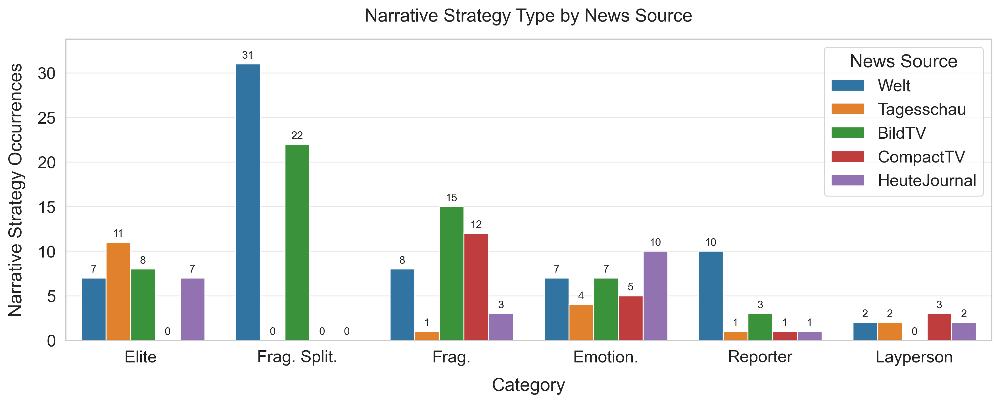

In [89]:
# Apply consistent styling

sns.set_context("paper", font_scale=1.6)
sns.set_style("whitegrid", {
    'grid.color': '.9',
    'axes.edgecolor': '.8'
})
sns.despine()



strat_cols = [
    "individualization_of_elite",
    "fragmentation_splitscreen",
    "fragmentation",
    "emotionalization",
    "individualization_of_reporter",
    "individualization_of_layperson",
]
df_strats = (
    df.loc[df.index != "Overall", strat_cols]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)
df_melt_strats = df_strats.melt(
    id_vars="NewsSource", 
    var_name="Category", 
    value_name="Count"
)


strat_label_map = {
    "individualization_of_elite": "Elite ",
    "fragmentation_splitscreen": "Frag. Split.",
    "fragmentation": "Frag.",
    "emotionalization": "Emotion.",
    "individualization_of_reporter": "Reporter",
    "individualization_of_layperson": "Layperson"
}
df_melt_strats["Category"] = df_melt_strats["Category"].map(strat_label_map)

# Set up figure
fig, ax = plt.subplots(figsize=(12, 5), dpi=300)
palette = sns.color_palette("tab10", 5)  # softer but distinct
sns.barplot(data=df_melt_strats, x="Category", y="Count", hue="NewsSource", ax=ax, palette=palette)

# Compress Y-axis just a little
max_val = df_melt_strats["Count"].max()
ax.set_ylim(0, max_val * 1.09)

for container in ax.containers:
    ax.bar_label(container, fontsize=9, padding=3)


# Style the plot
ax.set_title("Narrative Strategy Type by News Source", pad=15)
ax.set_xlabel("Category", labelpad=10)
ax.set_ylabel("Narrative Strategy Occurrences", labelpad=10)

# Adjust legend
ax.legend(title="News Source", loc="upper right", frameon=True)



plt.tight_layout()
plt.savefig("plots/FEP_by_source.png", bbox_inches='tight')
plt.show()
plt.close()


<Figure size 640x480 with 0 Axes>

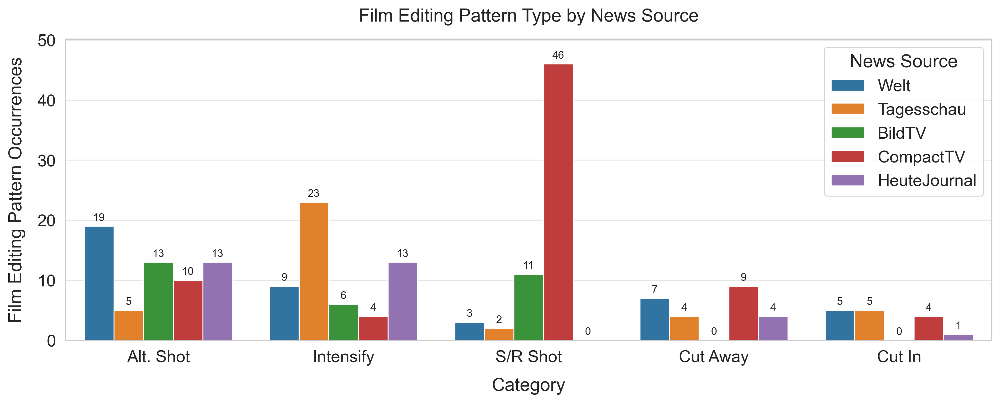

In [76]:

# Apply consistent styling
sns.set_context("paper", font_scale=1.6)
sns.set_style("whitegrid", {
    'grid.color': '.9',
    'axes.edgecolor': '.8'
})
sns.despine()

# Melt the dataframe for plotting
fep_cols = ["alternating-shot","intensify","shot-reverse-shot","cut-away","cut-in"]

df_feps = (
    df.loc[df.index != "Overall", fep_cols]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)
df_melt_feps = df_feps.melt(
    id_vars="NewsSource", 
    var_name="Category", 
    value_name="Count"
)


fep_label_map = {
    "alternating-shot": "Alt. Shot",
    "intensify": "Intensify",
    "shot-reverse-shot": "S/R Shot",
    "cut-away": "Cut Away",
    "cut-in": "Cut In"
}
df_melt_feps["Category"] = df_melt_feps["Category"].map(fep_label_map)

# Set up figure
fig, ax = plt.subplots(figsize=(12, 5), dpi=300)
palette = sns.color_palette("tab10", 5)  # softer but distinct
sns.barplot(data=df_melt_feps, x="Category", y="Count", hue="NewsSource", ax=ax, palette=palette)

# Compress Y-axis just a little
max_val = df_melt_feps["Count"].max()
ax.set_ylim(0, max_val * 1.09)

for container in ax.containers:
    ax.bar_label(container, fontsize=9, padding=3)


# Style the plot
ax.set_title("Film Editing Pattern Type by News Source", pad=15)
ax.set_xlabel("Category", labelpad=10)
ax.set_ylabel("Film Editing Pattern Occurrences", labelpad=10)

# Adjust legend
ax.legend(title="News Source", loc="upper right", frameon=True)



plt.tight_layout()
plt.savefig("plots/FEP_by_source.png", bbox_inches='tight')
plt.show()
plt.close()


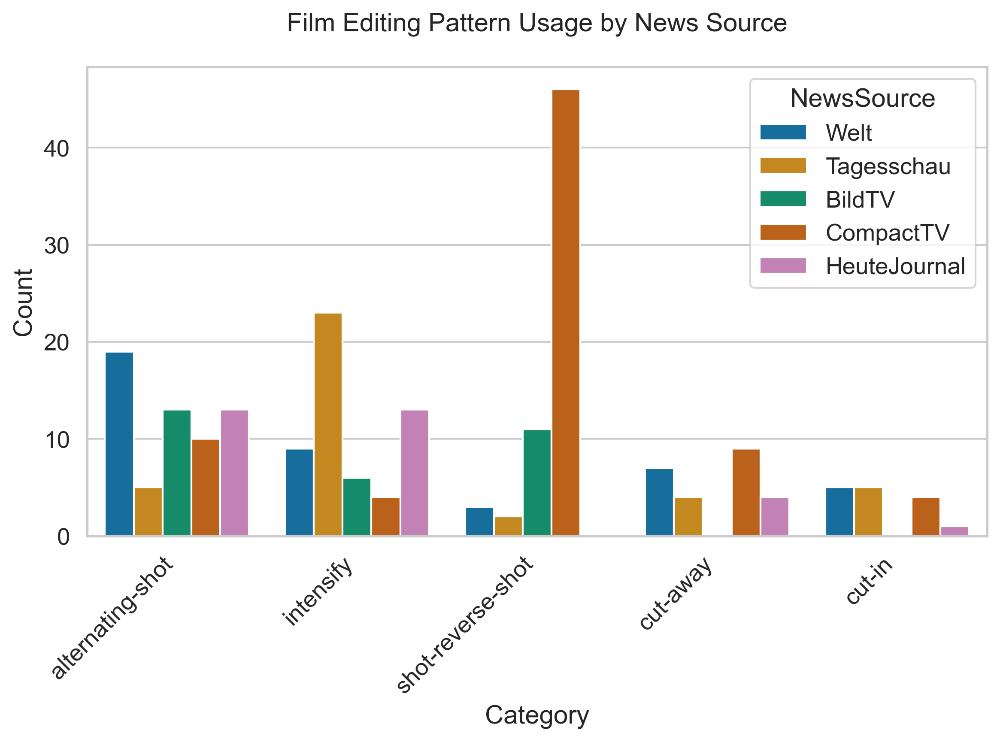

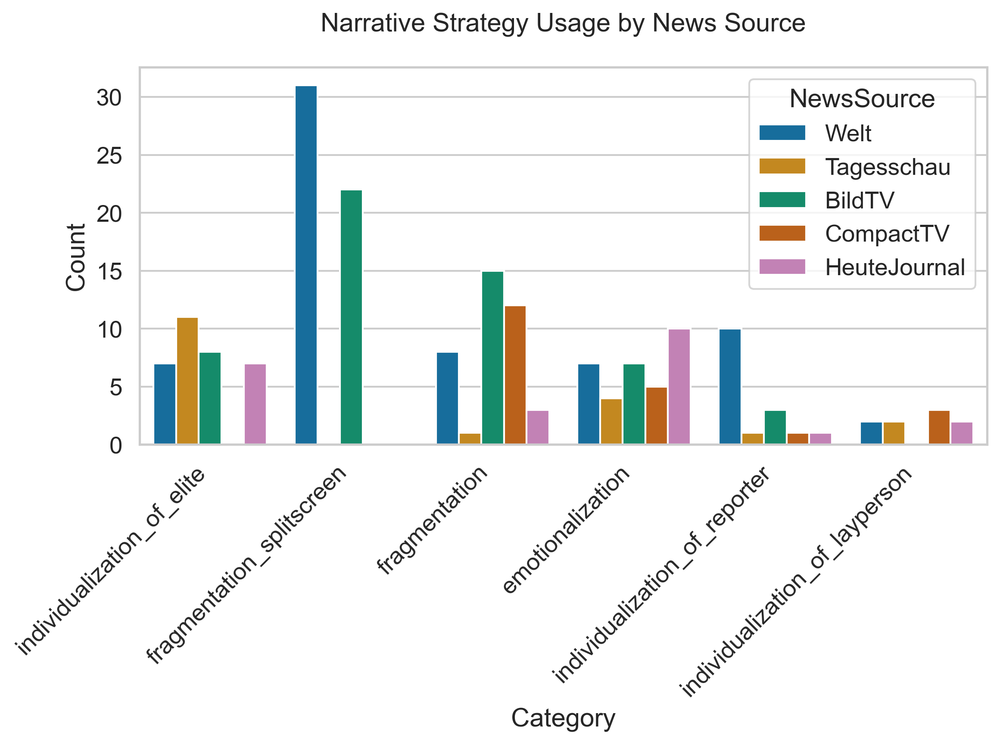

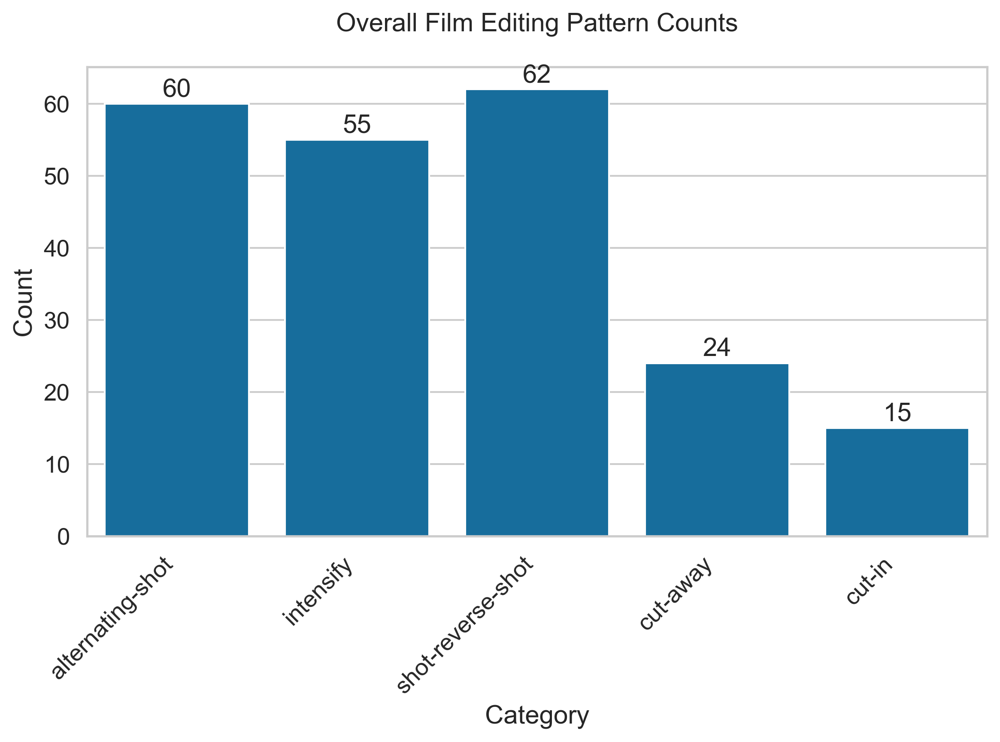

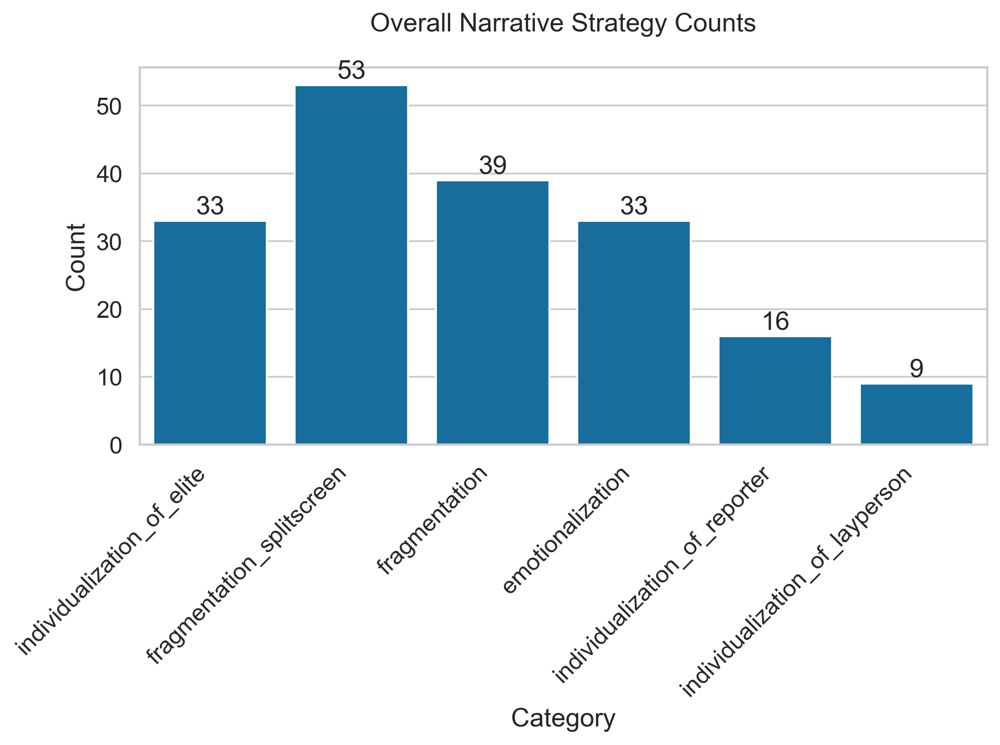

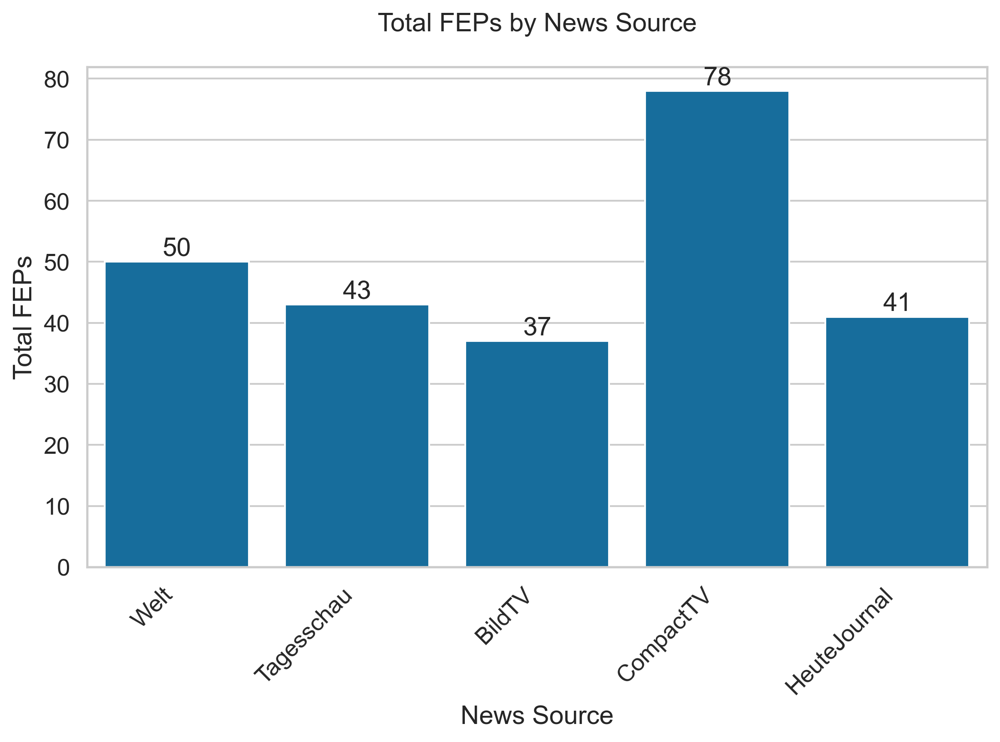

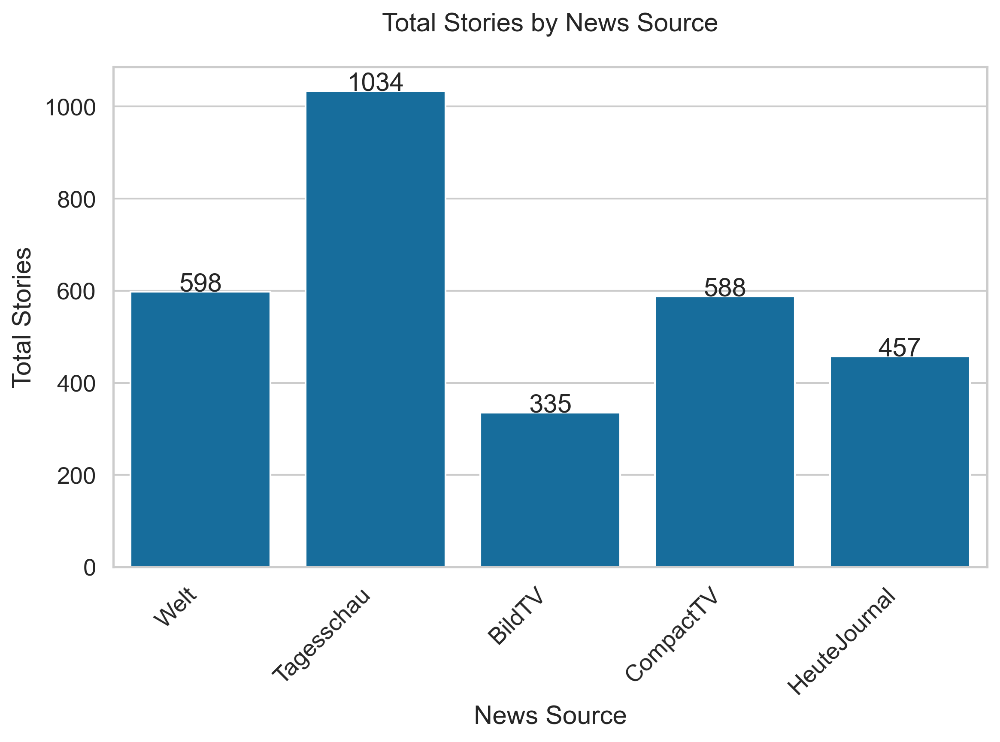

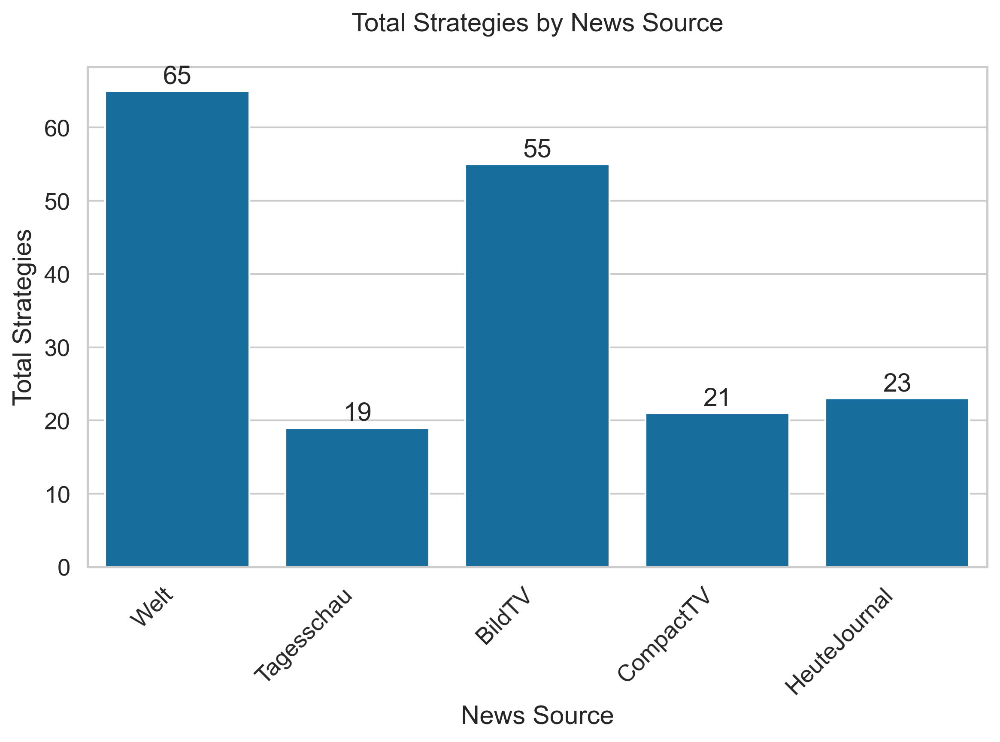

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


# Suppose `df` is your DataFrame with index = 
# ["Welt","Tagesschau","BildTV","CompactTV","HeuteJournal","Overall"]
df = stats_df
# --- 1) FEP usage by News Source ---
fep_cols = ["alternating-shot","intensify","shot-reverse-shot","cut-away","cut-in"]
df_feps = (
    df.loc[df.index != "Overall", fep_cols]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)
df_melt_feps = df_feps.melt(
    id_vars="NewsSource", 
    var_name="Category", 
    value_name="Count"
)

setup_plot_style("Film Editing Pattern Usage by News Source", "Category", "Count", (8, 6), 300)
sns.barplot(data=df_melt_feps, x="Category", y="Count", hue="NewsSource")
plt.legend(title="NewsSource")
plt.tight_layout()
plt.savefig("plots/FEP_by_source.png",bbox_inches='tight')
plt.show()
plt.close()


# --- 2) Narrative Strategy usage by News Source ---
strat_cols = [
    "individualization_of_elite",
    "fragmentation_splitscreen",
    "fragmentation",
    "emotionalization",
    "individualization_of_reporter",
    "individualization_of_layperson",
]
df_strats = (
    df.loc[df.index != "Overall", strat_cols]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)
df_melt_strats = df_strats.melt(
    id_vars="NewsSource", 
    var_name="Category", 
    value_name="Count"
)

setup_plot_style("Narrative Strategy Usage by News Source", "Category", "Count", (8, 6), 300)
sns.barplot(data=df_melt_strats, x="Category", y="Count", hue="NewsSource")
plt.legend(title="NewsSource")
plt.tight_layout()
plt.savefig("plots/Strategies_by_source.png", bbox_inches='tight')
plt.show()
plt.close()
# --- 3) Overall FEP Counts ---
# Using the "Overall" row for these categories
overall_feps = df.loc["Overall", fep_cols]

setup_plot_style("Overall Film Editing Pattern Counts", "Category", "Count", (8, 6), 300)
sns.barplot(x=overall_feps.index, y=overall_feps.values)
# Add text labels
for i, val in enumerate(overall_feps.values):
    plt.text(i, val + 1, str(val), ha='center')
plt.tight_layout()
plt.savefig("plots/Overall_FEP_counts.png", bbox_inches='tight')
plt.show()
plt.close()

# --- 4) Overall Narrative Strategy Counts ---
overall_strats = df.loc["Overall", strat_cols]

setup_plot_style("Overall Narrative Strategy Counts", "Category", "Count", (8, 6), 300)
sns.barplot(x=overall_strats.index, y=overall_strats.values)
# Add text labels
for i, val in enumerate(overall_strats.values):
    plt.text(i, val + 1, str(val), ha='center')
plt.tight_layout()
plt.savefig("plots/Overall_Strategies_counts.png", bbox_inches='tight')
plt.show()
plt.close()
# --- 5) Total FEPs by News Source ---
df_tot_feps = (
    df.loc[df.index != "Overall", "total_feps"]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)

setup_plot_style("Total FEPs by News Source", "News Source", "Total FEPs", (8, 6), 300)
sns.barplot(data=df_tot_feps, x="NewsSource", y="total_feps")
for i, val in enumerate(df_tot_feps["total_feps"]):
    plt.text(i, val + 1, str(val), ha='center')
plt.tight_layout()
plt.savefig("plots/Total_FEPs_by_source.png", bbox_inches='tight')
plt.show()
plt.close()

# --- 6) Total Stories by News Source ---
# Assuming 'all_shots' corresponds to the total stories.
df_tot_stories = (
    df.loc[df.index != "Overall", "all_shots"]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)

setup_plot_style("Total Shots by News Source", "News Source", "Total Stories", (8, 6), 300)
sns.barplot(data=df_tot_stories, x="NewsSource", y="all_shots")
for i, val in enumerate(df_tot_stories["all_shots"]):
    plt.text(i, val + 1, str(val), ha='center')
plt.tight_layout()
plt.savefig("plots/Total_Stories_by_source.png", bbox_inches='tight')
plt.show()
plt.close()

# --- 7) Total Strategies by News Source ---
df_tot_strats = (
    df.loc[df.index != "Overall", "total_strategies"]
      .reset_index()
      .rename(columns={"index": "NewsSource"})
)

setup_plot_style("Total Strategies by News Source", "News Source", "Total Strategies", (8, 6), 300)
sns.barplot(data=df_tot_strats, x="NewsSource", y="total_strategies")
for i, val in enumerate(df_tot_strats["total_strategies"]):
    plt.text(i, val + 1, str(val), ha='center')
plt.tight_layout()
plt.savefig("plots/Total_Strategies_by_source.png", bbox_inches='tight')
plt.show()
plt.close()


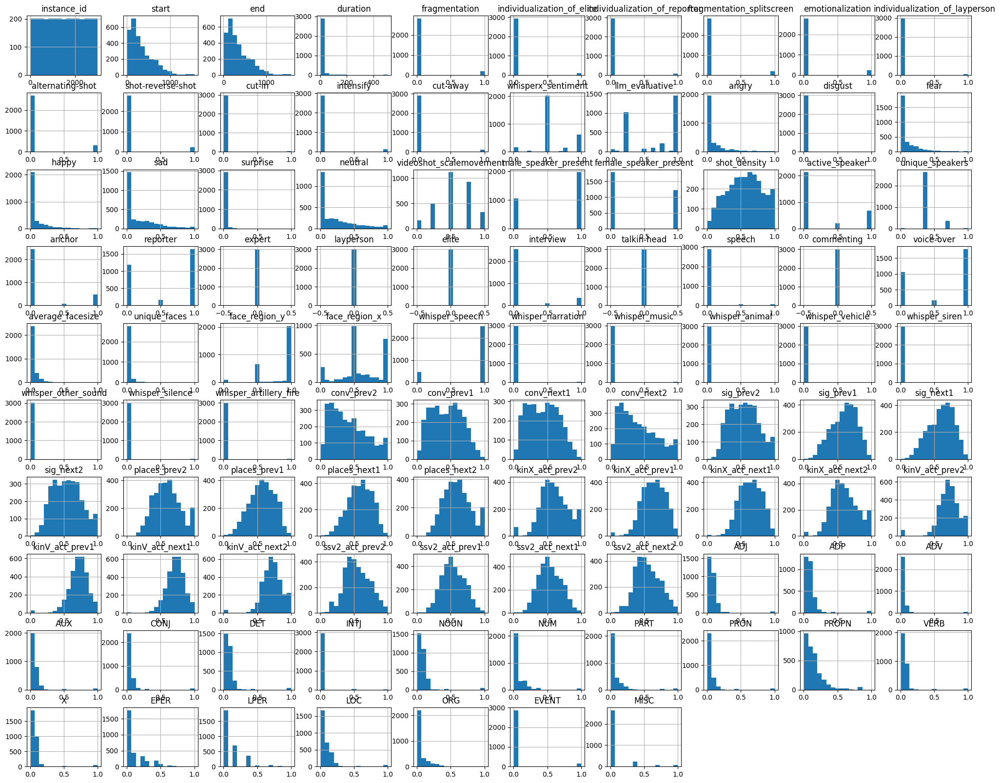

In [ ]:
df.hist(bins=15, figsize=(25, 20))	
plt.show()

Co-Occurences

In [ ]:
csv_data = df.to_csv(index=False)
# save csv in this directory for now
csv_path = os.path.join(notebook_dir, "all_shots.csv")
with open(csv_path, "w") as f:
    f.write(csv_data)

Loading data from C:/Users/Lea/Documents/MA/Repo/TemporalPatternDetection\data/processing/features.json
Loading data from C:/Users/Lea/Documents/MA/Repo/TemporalPatternDetection\encoding_params.json


In [ ]:
strategy_counts = df[all_strategies].sum()
fep_counts = df[all_feps].sum()

print("Strategy counts on shot basis:")
print(strategy_counts)
print("\nFEP counts on shot basis:")
print(fep_counts)

# 4. Co-occurrence matrices

# 4a. Strategy vs. Strategy co-occurrence
# Each cell (i,j) shows how many shots have both strategy i and j
strategy_cooccurrence = df[all_strategies].T.dot(df[all_strategies])
# 4b. FEP vs. FEP co-occurrence
fep_cooccurrence = df[all_feps].T.dot(df[all_feps])
# 4c. Strategy vs. FEP co-occurrence
# Each cell (i,j) shows how many shots have both strategy i and FEP j
strategy_fep_cooccurrence = df[all_strategies].T.dot(df[all_feps])


Strategy counts on shot basis:
fragmentation                     190
individualization_of_elite         86
individualization_of_reporter      56
fragmentation_splitscreen         189
emotionalization                  221
individualization_of_layperson     51
dtype: int64

FEP counts on shot basis:
alternating-shot     307
shot-reverse-shot    230
cut-in                41
intensify            127
cut-away             105
dtype: int64


In [ ]:
strategy_cooccurrence

,fragmentation,individualization_of_elite,individualization_of_reporter,fragmentation_splitscreen,emotionalization,individualization_of_layperson
fragmentation,189,4,0,0,0,0
individualization_of_elite,4,86,0,3,10,0
individualization_of_reporter,0,0,56,19,5,0
fragmentation_splitscreen,0,3,19,189,26,0
emotionalization,0,10,5,26,221,37
individualization_of_layperson,0,0,0,0,37,51


In [ ]:
fep_cooccurrence

,alternating-shot,shot-reverse-shot,cut-in,intensify,cut-away
alternating-shot,301,14,0,2,57
shot-reverse-shot,14,229,1,0,0
cut-in,0,1,41,3,1
intensify,2,0,3,127,0
cut-away,57,0,1,0,105


In [ ]:
strategy_fep_cooccurrence

,alternating-shot,shot-reverse-shot,cut-in,intensify,cut-away
fragmentation,10,1,3,11,17
individualization_of_elite,4,0,0,7,1
individualization_of_reporter,0,0,0,1,0
fragmentation_splitscreen,81,23,0,0,0
emotionalization,63,4,8,4,37
individualization_of_layperson,0,0,10,7,0


Correlation matrix between features (and targets?)

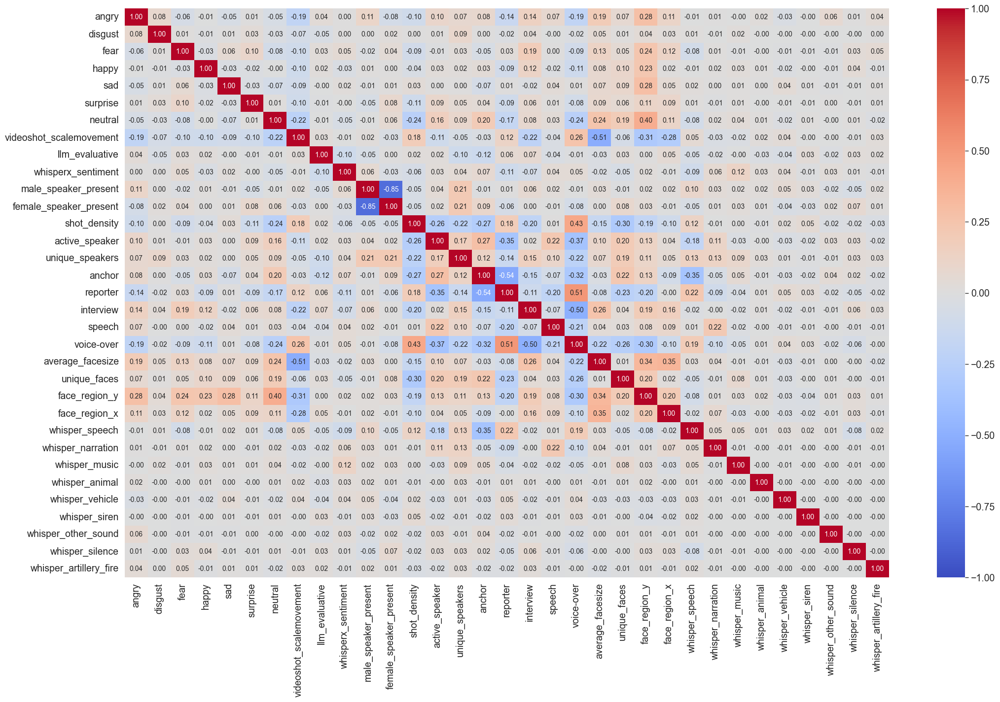

In [ ]:
# 0 features = "expert", "layperson", "elite", "talkin-head", "commenting"
num_features = ["angry", "disgust", "fear", "happy", "sad", "surprise", "neutral", "videoshot_scalemovement", "llm_evaluative", "whisperx_sentiment",  "male_speaker_present", "female_speaker_present", "shot_density",
                "active_speaker", "unique_speakers", "anchor", "reporter", "interview", "speech", "voice-over", "average_facesize", "unique_faces", "face_region_y", "face_region_x", 
                "whisper_speech", "whisper_narration", "whisper_music", "whisper_animal", "whisper_vehicle", "whisper_siren", "whisper_other_sound", "whisper_silence", "whisper_artillery_fire"]
pos_ner_features = ["ADJ", "ADP", "ADV", "AUX", "CONJ", "DET", "INTJ", "NOUN", "NUM", "PART", "PRON", "PROPN", "VERB", "X", "EPER", "LPER", "LOC", "ORG", "EVENT", "MISC"]
shot_relation_features = ["conv_prev2", "conv_prev1", "conv_next1", "conv_next2", "sig_prev2", "sig_prev1", "sig_next1", "sig_next2", "places_prev2", "places_prev1", "places_next1", "places_next2", 
                          "kinX_act_prev2", "kinX_act_prev1", "kinX_act_next1", "kinX_act_next2", "kinV_act_prev2", "kinV_act_prev1", "kinV_act_next1", "kinV_act_next2", "ssv2_act_prev2", "ssv2_act_prev1", "ssv2_act_next1", "ssv2_act_next2"]

features_feps = num_features + all_feps
features_strategies = num_features + all_strategies
features_all = num_features + all_strategies + all_feps
targets_all = all_strategies + all_feps

relation_feats_feps = shot_relation_features + all_feps
relation_feats_strategies = shot_relation_features + all_strategies
relation_feats_all = shot_relation_features + all_strategies + all_feps

pos_feats_feps = pos_ner_features + all_feps
pos_feats_strategies = pos_ner_features + all_strategies
pos_feats_all = pos_ner_features + all_strategies + all_feps

all_feats_feps = num_features + shot_relation_features+ pos_ner_features + all_feps
all_feats_strategies = num_features + shot_relation_features + pos_ner_features+ all_strategies
all_feats = num_features + shot_relation_features + pos_ner_features
all_feats_all_targets = num_features + shot_relation_features + pos_ner_features + all_strategies + all_feps

#df is overrtitten 
corr_features = df[num_features].corr()

plt.figure(figsize=(25, 15)) 
sns.heatmap(corr_features, annot=True , annot_kws={'size': 10}, cmap='coolwarm', fmt=".2f", vmax=1, vmin=-1) 
plt.savefig('studentsmain.png', dpi=300)
plt.show()

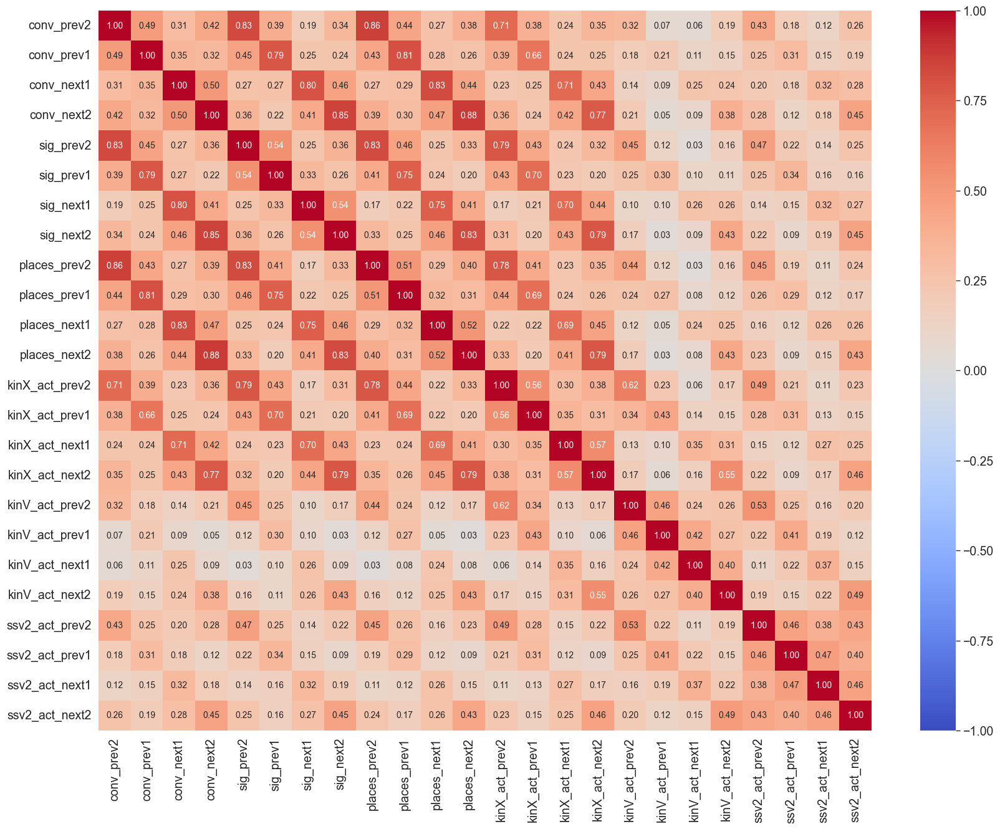

In [98]:
       
corr_features = df[shot_relation_features].corr()

plt.figure(figsize=(20, 15)) 
sns.heatmap(corr_features, annot=True , annot_kws={'size': 10}, cmap='coolwarm', fmt=".2f", vmax=1, vmin=-1) 
plt.savefig('studentsmain.png', dpi=300)
plt.show()

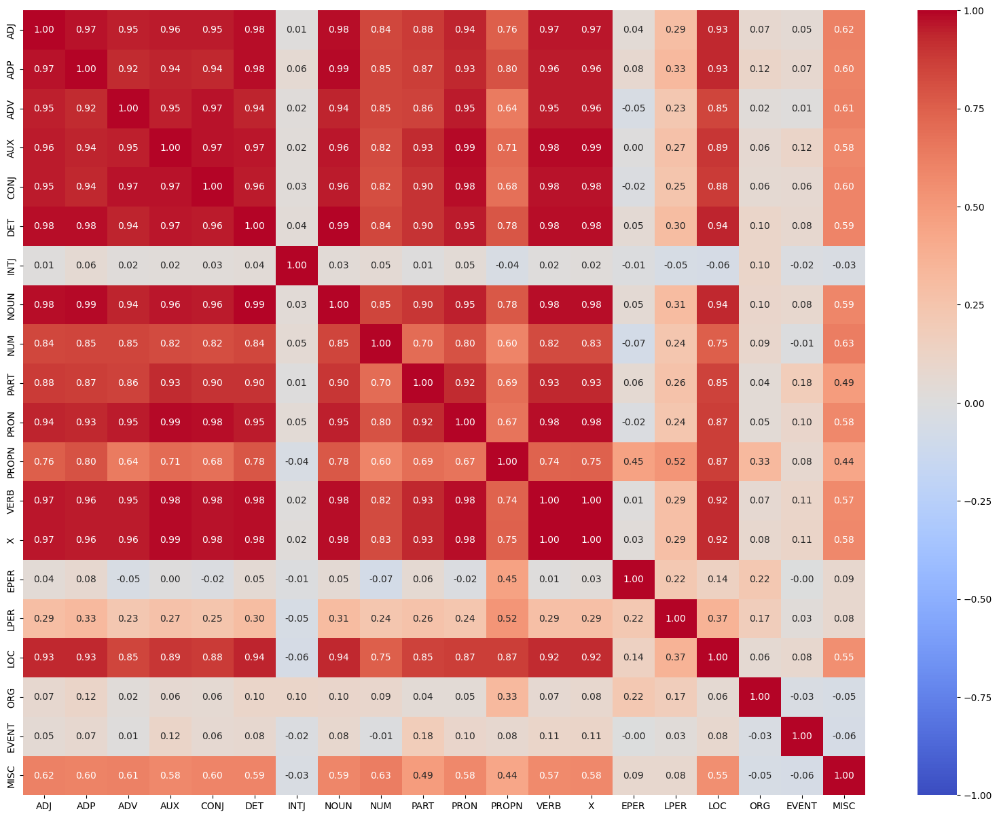

In [ ]:
corr_features = df[pos_ner_features].corr()

plt.figure(figsize=(20, 15)) 
sns.heatmap(corr_features, annot=True , annot_kws={'size': 10}, cmap='coolwarm', fmt=".2f", vmax=1, vmin=-1) 
plt.savefig('studentsmain.png', dpi=300)
plt.show()

In [ ]:
corr_feps = df[all_feats_feps].corr()
sub_corr_fep = corr_feps.loc[all_feps,all_feats]
corr_strategies = df[all_feats_strategies].corr()
sub_corr_strat = corr_strategies.loc[all_strategies,all_feats]
relevant_corrs = np.where(sub_corr_fep.abs() > 0.15)
relevant_features = [all_feats[j] for j in relevant_corrs[1]]


relevant_corrs = np.where(sub_corr_strat.abs() > 0.15)
relevant_features = relevant_features + [all_feats[j] for j in relevant_corrs[1]]
relevant_features = list(set(relevant_features))


#print(relevant_features)
# relevant features alphabetisch sortieren
relevant_features.sort()
print(relevant_features)
print(len(relevant_features))

# 'ADJ', 'ADP', 'ADV', 'AUX', 'CONJ', 'DET', 'NOUN', 'NUM', 'PART', 'PRON', 'PROPN', 'VERB'
# 'EPER', 'EVENT', 'LOC', 'MISC',
#active-speaker,  'anchor', 'angry', 'average_facesize', 'face_region_y', 'fear', 'interview',  'reporter', 'shot_density','speech', 'videoshot_scalemovement','voice-over', 'whisper_speech'


['ADJ', 'ADP', 'ADV', 'AUX', 'CONJ', 'DET', 'EPER', 'EVENT', 'LOC', 'MISC', 'NOUN', 'NUM', 'PART', 'PRON', 'PROPN', 'VERB', 'X', 'active_speaker', 'anchor', 'angry', 'average_facesize', 'conv_next1', 'conv_next2', 'conv_prev1', 'conv_prev2', 'face_region_y', 'fear', 'interview', 'kinV_act_next1', 'kinV_act_next2', 'kinV_act_prev1', 'kinV_act_prev2', 'kinX_act_next1', 'kinX_act_next2', 'kinX_act_prev1', 'kinX_act_prev2', 'places_next1', 'places_next2', 'places_prev1', 'places_prev2', 'reporter', 'shot_density', 'sig_next1', 'sig_next2', 'sig_prev1', 'sig_prev2', 'speech', 'ssv2_act_next1', 'ssv2_act_next2', 'ssv2_act_prev1', 'ssv2_act_prev2', 'videoshot_scalemovement', 'voice-over', 'whisper_speech']
54


['EVENT']
Strategy vs. Feature correlations:
alternating-shot vs. speech: 0.1740390389340912


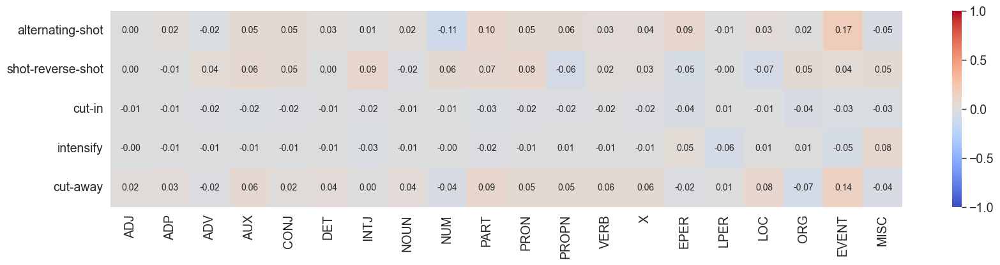

In [107]:

corr_feps = df[pos_feats_feps].corr()
sub_corr = corr_feps.loc[all_feps,pos_ner_features]
relevant_corrs = np.where(np.abs(sub_corr) > 0.15)
relevant_features = [pos_ner_features[j] for j in relevant_corrs[1]]
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_feps[i]} vs. {num_features[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(20, 4))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)
plt.savefig('studentsmain.png', dpi=300)
plt.show()


['reporter', 'voice-over', 'angry', 'fear', 'videoshot_scalemovement', 'shot_density', 'interview', 'voice-over', 'average_facesize', 'face_region_y', 'whisper_speech', 'speech']
Strategy vs. Feature correlations:
alternating-shot vs. reporter: -0.15318187575851056
alternating-shot vs. voice-over: -0.2102696655347655
shot-reverse-shot vs. angry: 0.2162631663929624
shot-reverse-shot vs. fear: 0.1799693983937603
shot-reverse-shot vs. videoshot_scalemovement: -0.1719266619379876
shot-reverse-shot vs. shot_density: -0.18926637693967782
shot-reverse-shot vs. interview: 0.3892553478559106
shot-reverse-shot vs. voice-over: -0.29875483200061603
shot-reverse-shot vs. average_facesize: 0.15290557377890945
shot-reverse-shot vs. face_region_y: 0.1750028148409444
shot-reverse-shot vs. whisper_speech: -0.16068218299877815
cut-away vs. speech: 0.19293795159133917


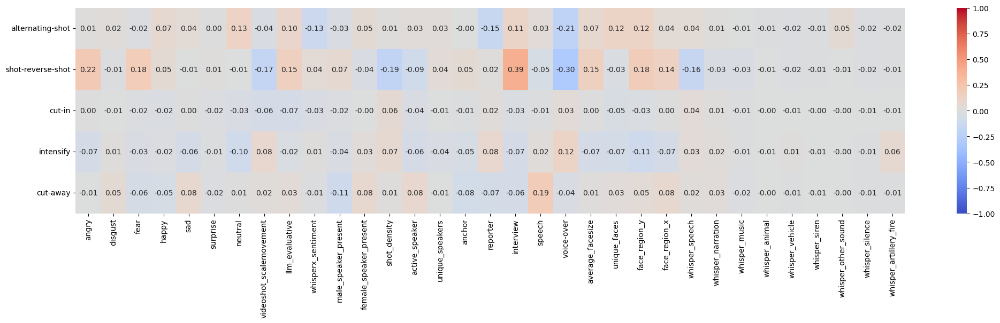

In [ ]:

corr_feps = df[features_feps].corr()
sub_corr = corr_feps.loc[all_feps,num_features]
relevant_corrs = np.where(np.abs(sub_corr) > 0.15)
relevant_features = [num_features[j] for j in relevant_corrs[1]]
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_feps[i]} vs. {num_features[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(25, 5))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)
plt.savefig('studentsmain.png', dpi=300)
plt.show()


{'places_prev2', 'kinX_act_next2', 'conv_next2', 'ssv2_act_prev2', 'sig_next2', 'places_prev1', 'conv_prev2', 'conv_prev1', 'places_next2', 'places_next1', 'sig_prev2', 'conv_next1', 'ssv2_act_next2', 'kinX_act_prev2'}
Strategy vs. Feature correlations:
alternating-shot vs. conv_next2: 0.25279021611868485
shot-reverse-shot vs. conv_prev2: 0.39028078726891496
shot-reverse-shot vs. conv_prev1: 0.2813462261085836
shot-reverse-shot vs. conv_next1: 0.2741325641818001
shot-reverse-shot vs. conv_next2: 0.3943312384622119
shot-reverse-shot vs. sig_prev2: 0.3495019077362065
shot-reverse-shot vs. sig_next2: 0.34204206577101887
shot-reverse-shot vs. places_prev2: 0.37616275463800053
shot-reverse-shot vs. places_prev1: 0.31007895053578777
shot-reverse-shot vs. places_next1: 0.3007453631284278
shot-reverse-shot vs. places_next2: 0.372629211734512
shot-reverse-shot vs. kinX_act_prev2: 0.34066096196341555
shot-reverse-shot vs. kinX_act_next2: 0.3462254859148477
shot-reverse-shot vs. ssv2_act_prev2: 0

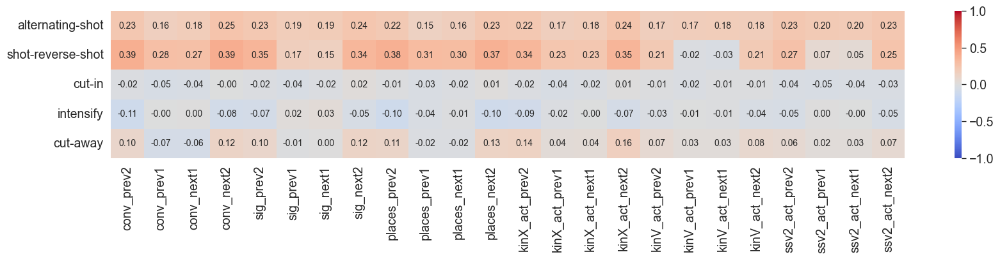

In [102]:
corr_feps = df[relation_feats_feps].corr()
sub_corr = corr_feps.loc[all_feps,shot_relation_features]
relevant_corrs = np.where(np.abs(sub_corr) > 0.25)
relevant_features = set([shot_relation_features[j] for j in relevant_corrs[1]])
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_feps[i]} vs. {shot_relation_features[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(20, 3))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)
plt.savefig('studentsmain.png', dpi=300)
plt.show()

corr_features = df[shot_relation_features].corr()



{'places_prev2', 'kinX_act_next2', 'voice-over', 'conv_next2', 'ssv2_act_prev2', 'sig_next2', 'places_prev1', 'conv_prev2', 'conv_prev1', 'places_next2', 'places_next1', 'sig_prev2', 'conv_next1', 'interview', 'ssv2_act_next2', 'kinX_act_prev2'}
Strategy vs. Feature correlations:
alternating-shot vs. conv_next2: 0.25279021611868485
shot-reverse-shot vs. interview: 0.3892553478559106
shot-reverse-shot vs. voice-over: -0.29875483200061603
shot-reverse-shot vs. conv_prev2: 0.39028078726891496
shot-reverse-shot vs. conv_prev1: 0.2813462261085836
shot-reverse-shot vs. conv_next1: 0.2741325641818001
shot-reverse-shot vs. conv_next2: 0.3943312384622119
shot-reverse-shot vs. sig_prev2: 0.3495019077362065
shot-reverse-shot vs. sig_next2: 0.34204206577101887
shot-reverse-shot vs. places_prev2: 0.37616275463800053
shot-reverse-shot vs. places_prev1: 0.31007895053578777
shot-reverse-shot vs. places_next1: 0.3007453631284278
shot-reverse-shot vs. places_next2: 0.372629211734512
shot-reverse-shot vs

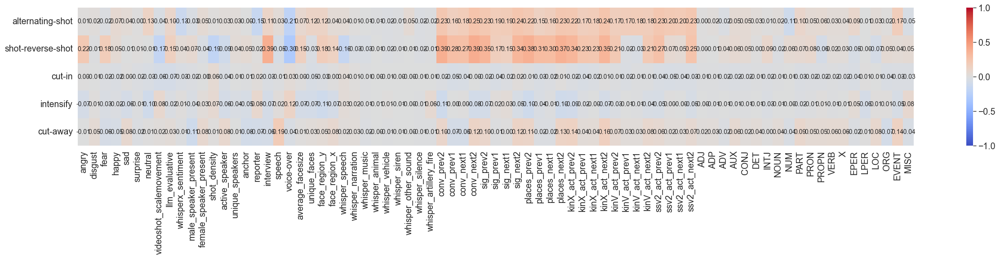

In [104]:
corr_feps = df[all_feats_feps].corr()
sub_corr = corr_feps.loc[all_feps,all_feats]
relevant_corrs = np.where(np.abs(sub_corr) > 0.25)
relevant_features = set([all_feats[j] for j in relevant_corrs[1]])
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_feps[i]} vs. {all_feats[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(30, 4))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)
plt.savefig('studentsmain.png', dpi=300)
plt.show()


['ADJ', 'ADP', 'ADV', 'AUX', 'CONJ', 'DET', 'NOUN', 'NUM', 'PART', 'PRON', 'PROPN', 'VERB', 'X', 'LOC', 'MISC']
Strategy vs. Feature correlations:
alternating-shot vs. ADJ: 0.4305402613253157
alternating-shot vs. ADP: 0.4372412368058817
alternating-shot vs. ADV: 0.47315482857437585
alternating-shot vs. AUX: 0.42864361526776124
alternating-shot vs. CONJ: 0.4461725512804728
alternating-shot vs. DET: 0.43094821943431827
alternating-shot vs. NOUN: 0.43290228493060173
alternating-shot vs. NUM: 0.4027636883297468
alternating-shot vs. PART: 0.3810777633539259
alternating-shot vs. PRON: 0.437662138060274
alternating-shot vs. PROPN: 0.30116825209520587
alternating-shot vs. VERB: 0.43372981751398937
alternating-shot vs. X: 0.4364923940373195
alternating-shot vs. LOC: 0.3738596992534478
alternating-shot vs. MISC: 0.26106936589344243


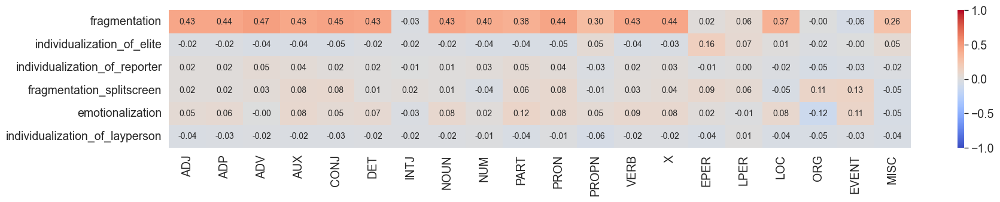

In [106]:

corr = df[pos_feats_strategies].corr()
sub_corr = corr.loc[all_strategies,pos_ner_features]
relevant_corrs = np.where(np.abs(sub_corr) > 0.25)
relevant_features = [pos_ner_features[j] for j in relevant_corrs[1]]
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_feps[i]} vs. {pos_ner_features[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(20, 3))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)
plt.savefig('studentsmain.png', dpi=300)
plt.show()


['anchor', 'reporter', 'whisper_speech', 'active_speaker', 'voice-over', 'anchor', 'reporter', 'interview', 'voice-over', 'active_speaker']
Strategy vs. Feature correlations:
fragmentation vs. anchor: 0.24527513490755848
fragmentation vs. reporter: -0.165342140775255
fragmentation vs. whisper_speech: -0.2028891157956698
individualization_of_reporter vs. active_speaker: 0.19639141966024967
individualization_of_reporter vs. voice-over: -0.1520403028663243
fragmentation_splitscreen vs. anchor: 0.1604690694968583
fragmentation_splitscreen vs. reporter: -0.21202502047268829
fragmentation_splitscreen vs. interview: 0.18022783253589703
fragmentation_splitscreen vs. voice-over: -0.32817541588680316
emotionalization vs. active_speaker: 0.15292897242552703


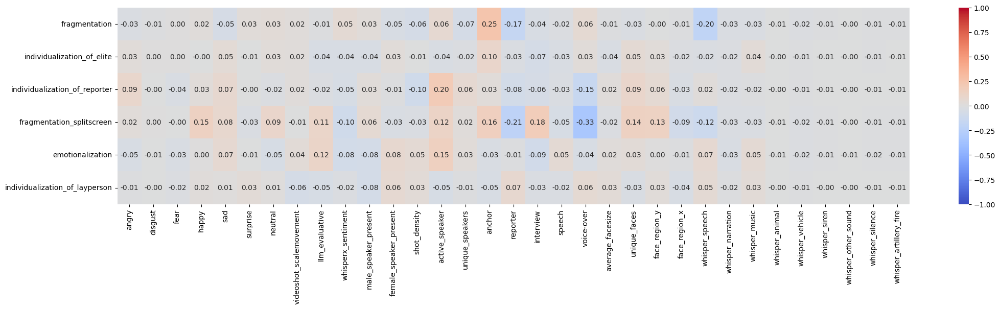

In [ ]:
features_strategies = num_features + all_strategies
corr_strategies = df[features_strategies].corr()
sub_corr = corr_strategies.loc[all_strategies,num_features]
relevant_corrs = np.where(np.abs(sub_corr) > 0.15)
relevant_features = [num_features[j] for j in relevant_corrs[1]]
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_strategies[i]} vs. {num_features[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(25, 5))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)

plt.savefig('studentsmain.png', dpi=300)
plt.show()


['conv_prev1', 'conv_next1', 'sig_prev1', 'sig_next1', 'ssv2_act_prev2', 'ssv2_act_prev1', 'ssv2_act_next1', 'ssv2_act_next2']
Strategy vs. Feature correlations:
fragmentation_splitscreen vs. conv_prev1: 0.3051859758182933
fragmentation_splitscreen vs. conv_next1: 0.29366538164956235
fragmentation_splitscreen vs. sig_prev1: 0.2836285041142889
fragmentation_splitscreen vs. sig_next1: 0.27878993494704407
fragmentation_splitscreen vs. ssv2_act_prev2: 0.29169905080404923
fragmentation_splitscreen vs. ssv2_act_prev1: 0.3299808187614255
fragmentation_splitscreen vs. ssv2_act_next1: 0.3197760451268444
fragmentation_splitscreen vs. ssv2_act_next2: 0.2778659323085687


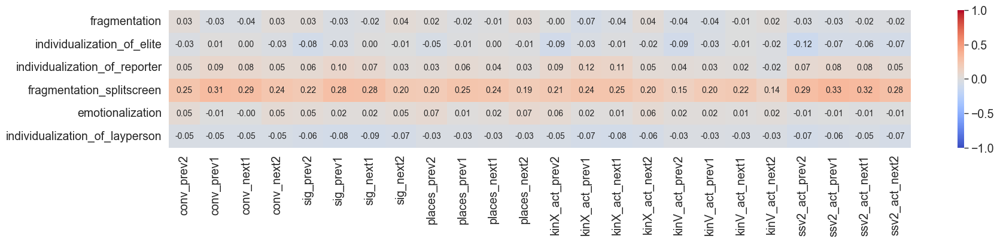

In [105]:
corr_strategies = df[relation_feats_strategies].corr()
sub_corr = corr_strategies.loc[all_strategies, shot_relation_features]
relevant_corrs = np.where(np.abs(sub_corr) > 0.25)
relevant_features = [shot_relation_features[j] for j in relevant_corrs[1]]
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_strategies[i]} vs. {shot_relation_features[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(20, 3))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)

plt.savefig('studentsmain.png', dpi=300)
plt.show()


38
['anchor', 'whisper_speech', 'ADJ', 'ADP', 'ADV', 'AUX', 'CONJ', 'DET', 'NOUN', 'NUM', 'PART', 'PRON', 'PROPN', 'VERB', 'X', 'LOC', 'MISC', 'reporter', 'voice-over', 'conv_prev2', 'conv_prev1', 'conv_next1', 'conv_next2', 'sig_prev2', 'sig_prev1', 'sig_next1', 'sig_next2', 'places_prev2', 'places_prev1', 'places_next1', 'kinX_act_prev2', 'kinX_act_prev1', 'kinX_act_next1', 'kinV_act_next1', 'ssv2_act_prev2', 'ssv2_act_prev1', 'ssv2_act_next1', 'ssv2_act_next2']
Strategy vs. Feature correlations:
fragmentation vs. anchor: 0.24527513490755848
fragmentation vs. whisper_speech: -0.2028891157956698
fragmentation vs. ADJ: 0.4305402613253157
fragmentation vs. ADP: 0.4372412368058817
fragmentation vs. ADV: 0.47315482857437585
fragmentation vs. AUX: 0.42864361526776124
fragmentation vs. CONJ: 0.4461725512804728
fragmentation vs. DET: 0.43094821943431827
fragmentation vs. NOUN: 0.43290228493060173
fragmentation vs. NUM: 0.4027636883297468
fragmentation vs. PART: 0.3810777633539259
fragmentati

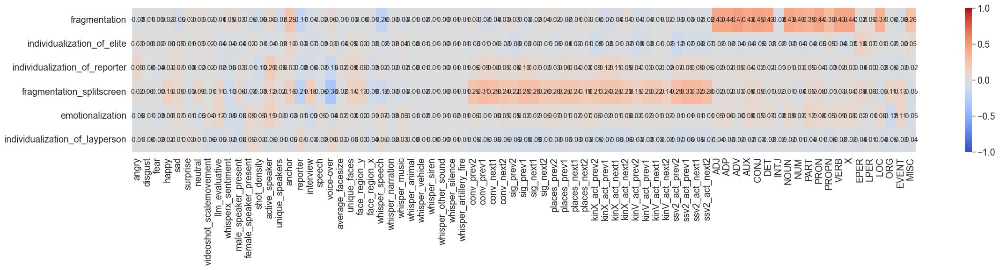

In [110]:
corr_strategies = df[all_feats_strategies].corr()
sub_corr = corr_strategies.loc[all_strategies, all_feats]
relevant_corrs = np.where(np.abs(sub_corr) > 0.2)
relevant_features = [all_feats[j] for j in relevant_corrs[1]]
print(len(relevant_features))
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{all_strategies[i]} vs. {all_feats[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(27, 4))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)

plt.savefig('studentsmain.png', dpi=300)
plt.show()


In [111]:
features_feps = num_features + all_feps
features_strategies = num_features + all_strategies
features_all = num_features + all_strategies + all_feps
targets_all = all_strategies + all_feps

relation_feats_feps = shot_relation_features + all_feps
relation_feats_strategies = shot_relation_features + all_strategies
relation_feats_all = shot_relation_features + all_strategies + all_feps

pos_feats_feps = pos_ner_features + all_feps
pos_feats_strategies = pos_ner_features + all_strategies
pos_feats_all = pos_ner_features + all_strategies + all_feps

all_feats_feps = num_features + shot_relation_features + pos_ner_features + all_feps
all_feats_strategies = num_features + shot_relation_features + pos_ner_features + all_strategies
all = num_features + shot_relation_features + pos_ner_features + all_strategies + all_feps
all_feats = num_features + shot_relation_features + pos_ner_features

all

['angry',
 'disgust',
 'fear',
 'happy',
 'sad',
 'surprise',
 'neutral',
 'videoshot_scalemovement',
 'llm_evaluative',
 'whisperx_sentiment',
 'male_speaker_present',
 'female_speaker_present',
 'shot_density',
 'active_speaker',
 'unique_speakers',
 'anchor',
 'reporter',
 'interview',
 'speech',
 'voice-over',
 'average_facesize',
 'unique_faces',
 'face_region_y',
 'face_region_x',
 'whisper_speech',
 'whisper_narration',
 'whisper_music',
 'whisper_animal',
 'whisper_vehicle',
 'whisper_siren',
 'whisper_other_sound',
 'whisper_silence',
 'whisper_artillery_fire',
 'conv_prev2',
 'conv_prev1',
 'conv_next1',
 'conv_next2',
 'sig_prev2',
 'sig_prev1',
 'sig_next1',
 'sig_next2',
 'places_prev2',
 'places_prev1',
 'places_next1',
 'places_next2',
 'kinX_act_prev2',
 'kinX_act_prev1',
 'kinX_act_next1',
 'kinX_act_next2',
 'kinV_act_prev2',
 'kinV_act_prev1',
 'kinV_act_next1',
 'kinV_act_next2',
 'ssv2_act_prev2',
 'ssv2_act_prev1',
 'ssv2_act_next1',
 'ssv2_act_next2',
 'ADJ',
 'A

37
['ADJ', 'ADP', 'ADV', 'AUX', 'CONJ', 'DET', 'LOC', 'MISC', 'NOUN', 'NUM', 'PART', 'PRON', 'PROPN', 'VERB', 'X', 'anchor', 'conv_next1', 'conv_next2', 'conv_prev1', 'conv_prev2', 'interview', 'kinX_act_next1', 'kinX_act_next2', 'kinX_act_prev2', 'places_next1', 'places_next2', 'places_prev1', 'places_prev2', 'sig_next1', 'sig_next2', 'sig_prev1', 'sig_prev2', 'ssv2_act_next1', 'ssv2_act_next2', 'ssv2_act_prev1', 'ssv2_act_prev2', 'voice-over']
Strategy vs. Feature correlations:
fragmentation vs. anchor: 0.24527513490755848
fragmentation vs. ADJ: 0.4305402613253157
fragmentation vs. ADP: 0.4372412368058817
fragmentation vs. ADV: 0.47315482857437585
fragmentation vs. AUX: 0.42864361526776124
fragmentation vs. CONJ: 0.4461725512804728
fragmentation vs. DET: 0.43094821943431827
fragmentation vs. NOUN: 0.43290228493060173
fragmentation vs. NUM: 0.4027636883297468
fragmentation vs. PART: 0.3810777633539259
fragmentation vs. PRON: 0.437662138060274
fragmentation vs. PROPN: 0.301168252095205

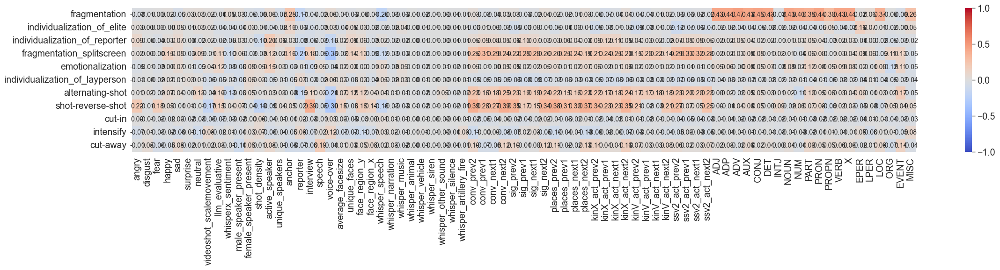

In [121]:
corr = df[all].corr()
sub_corr = corr.loc[targets_all, all_feats]
relevant_corrs = np.where(np.abs(sub_corr) > 0.245)
relevant_features = [all_feats[j] for j in relevant_corrs[1]]
relevant_features = list(set(relevant_features))
relevant_features.sort()
print(len(relevant_features))
print(relevant_features)
print("Strategy vs. Feature correlations:")
for i, j in zip(relevant_corrs[0], relevant_corrs[1]):
    print(f"{targets_all[i]} vs. {all_feats[j]}: {sub_corr.iloc[i, j]}")
# 3. Plot the heatmap with the scale fixed to -1 and 1
plt.figure(figsize=(27, 4))
sns.heatmap(
    sub_corr, 
    annot=True,
    annot_kws={'size': 10},
    cmap='coolwarm',
    fmt=".2f",
    vmin=-1,   # force lower bound
    vmax=1     # force upper bound
)

plt.savefig('studentsmain.png', dpi=300)
plt.show()


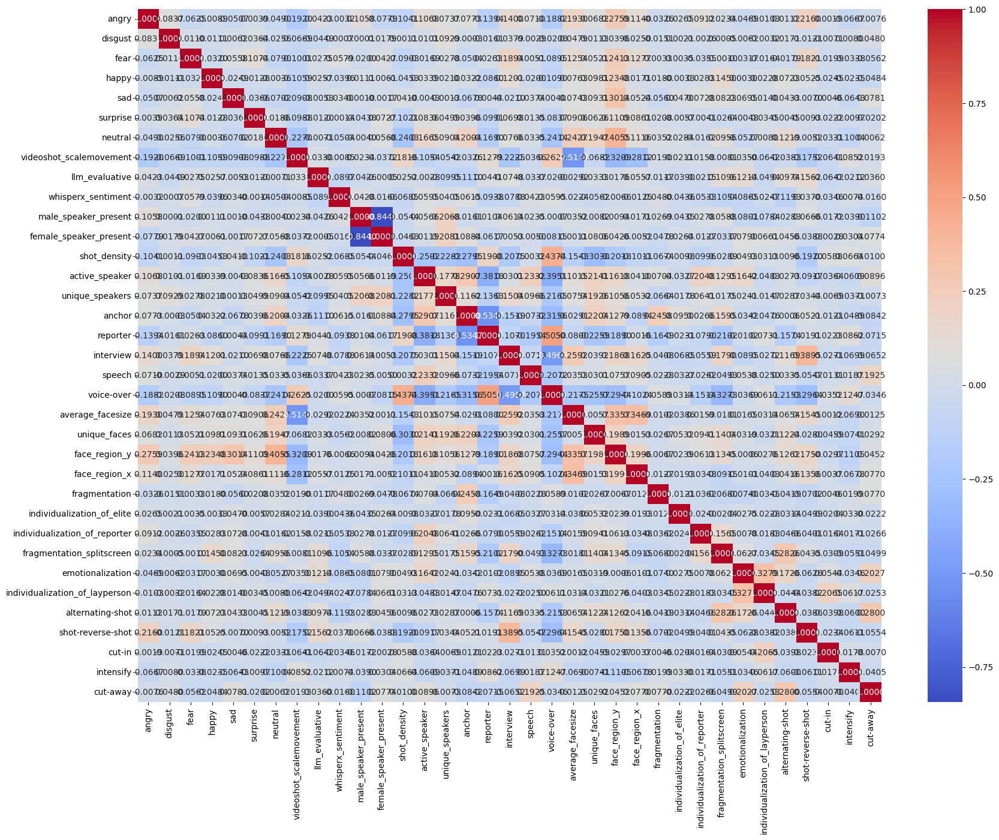

In [ ]:
corr_all = df[features_all].corr()
plt.figure(figsize=(20, 15)) 
sns.heatmap(corr_all, annot=True , annot_kws={'size': 10}, cmap='coolwarm', fmt=".4f") 
plt.savefig('studentsmain.png', dpi=300)
plt.show()


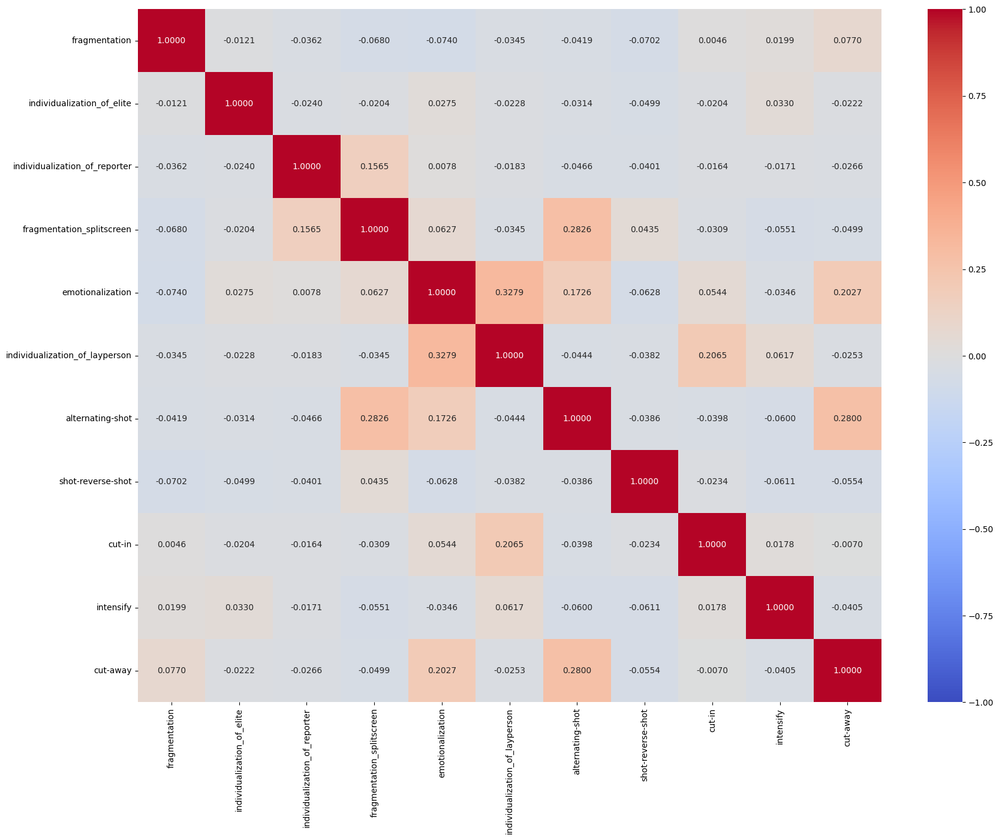

In [ ]:
corr_targets = df[targets_all].corr()
plt.figure(figsize=(20, 15))    
sns.heatmap(corr_targets, annot=True , annot_kws={'size': 10}, cmap='coolwarm', fmt=".4f", vmax=1, vmin=-1)
plt.savefig('studentsmain.png', dpi=300)
plt.show()